# Mixture Model to enhance prediction for OC and HP patients

**this notebook works with .venv2 and uses the new lymph package**

In this notebook i will use the new forked model and try to adapt it to handel the mixture model likelihoood as described below. 


The steps should roughly look like this:
1. Create the datasets (simple, graph_lnlT1T2)
2. Create the model with the new lymph package
3. Implement the likelihood in the model
4. Check if the likelihood works by using model.likelihood(params, Pi).
5. Use ML estimation to show the true mixture component
6. Use MC sampling to show problem of degeneration
7. Either reduce the degree of freedom in the sampling space, or implement the EM algortihm


I implemented the EM algortihm.

After i used the data S1 S2 S3 again (real data) to check wheter the results make sense:
Outcome: 
- Good results, Proof of concept
- smooothening of certain edges in prevalences 


Next steps are in mm_expl_oc_hp.ipynb




from util import 3

In [1]:
# Reload the modules on kernel restart
%load_ext autoreload
%autoreload 2
from util_2 import create_synth_data, create_prev_vectors, late_binomial, set_size
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
import itertools
import lymph
from lyscripts.predict.prevalences import compute_observed_prevalence, compute_predicted_prevalence, generate_predicted_prevalences
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
plt.style.use('/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/styles/mplstyle_rl.txt')
from pathlib import Path
import corner 
import warnings
from scipy.special import factorial
from scipy.optimize import minimize
import sys
from cycler import cycler
PLOT_PATH = Path("./figures/expl_oc_hp/")
SAMPLES_PATH = "samples/expl_oc_hp/"

## Definitions

In [2]:
# Plotting styles
usz_blue = "#005ea8"
usz_blue_border = "#2387D5"
usz_green = "#00afa5"
usz_green_border = "#30DFD5"
usz_red = "#ae0060"
usz_red_border = "#FB4EAE"
usz_orange = "#f17900"
usz_orange_border = "#F8AB5C"
usz_gray = "#c5d5db"
usz_gray_border = "#DFDFDF"
#sn.set_theme()
COLORS = {
    "blue": '#005ea8',
    "orange": '#f17900',
    "green": '#00afa5',
    "red": '#ae0060',
    "gray": '#c5d5db',
}
colors = [usz_blue, usz_green, usz_red, usz_orange, usz_gray]
edge_colors = [usz_blue_border, usz_green_border, usz_red_border, usz_orange_border, usz_gray_border]


In [3]:
# utils
desc_to_icd = {'Lip': 'C00',
 'Base of tongue': 'C01',
 'Other and unspecified parts of tongue': 'C02',
 'Gum': 'C03',
 'Floor of mouth': 'C04',
 'Palate': 'C05',
 'Other and unspecified parts of mouth': 'C06',
 'Parotid gland': 'C07',
 'Other and unspecified major salivary gland': 'C08',
 'Tonsil': 'C09',
 'Oropharynx': 'C10',
 'Nasopharynx': 'C11',
 'Pyriform sinus': 'C12',
 'Hypopharynx': 'C13',
 'Other and ill-defined sites in lip, oral cavity and pharynx': 'C14',
 'Nasal cavity and middle ear': 'C30',
 'Accessory sinuses': 'C31',
 'Larynx': 'C32',
 'Thyroid gland': 'C73'}
icd_to_desc = {v: k for k, v in desc_to_icd.items()}


# SUBSITE_DICT = {
#     "base":        ["C01"  , "C01.9"],
#     "tonsil":      ["C09"  , "C09.0", "C09.1", "C09.8", "C09.9"],
#     "rest_oro":    ["C10"  , "C10.0", "C10.1", "C10.2", "C10.3",
#                     "C10.4", "C10.8", "C10.9"],
#     "rest_hypo":   ["C12"  , "C12.9",
#                     "C13"  , "C13.0", "C13.1", "C13.2", "C13.8", "C13.9"],
#     "glottis":     ["C32"  , "C32.0"],
#     "rest_larynx": ["C32.1", "C32.2", "C32.3", "C32.8", "C32.9"],
#     "tongue":      ["C02"  , "C02.0", "C02.1", "C02.2", "C02.3", "C02.4", "C02.8",
#                     "C02.9",],
#     "gum_cheek":   ["C03"  , "C03.0", "C03.1", "C03.9",
#                     "C06"  , "C06.0", "C06.1", "C06.2", "C06.8", "C06.9",],
#     "mouth_floor": ["C04"  , "C04.0", "C04.1", "C04.8", "C04.9",],
#     "palate":      ["C05"  , "C05.0", "C05.1", "C05.2", "C05.8", "C05.9",],
#     "glands":      ["C08"  , "C08.0", "C08.1", "C08.9",],
# }
# SUBSITE_LIST = [icd for icd_list in SUBSITE_DICT.values() for icd in icd_list]

In [4]:
# Some function definitions

def binom_pmf(k: np.ndarray, n: int, p: float):
    """Binomial PMF"""
    if p > 1. or p < 0.:
        raise ValueError("Binomial prob must be btw. 0 and 1")
    q = (1. - p)
    binom_coeff = factorial(n) / (factorial(k) * factorial(n - k))
    return binom_coeff * p**k * q**(n - k)

def late_binomial(support: np.ndarray, p: float = 0.5) -> np.ndarray:
    """Parametrized binomial distribution."""
    return binom_pmf(k=support, n=support[-1], p=p)

def create_models(n, graph=None, include_late=True,ignore_t_stage=False, n_mixture_components = 1) -> list[lymph.models.Unilateral] | lymph.models.Unilateral:
    if graph is None:
        graph = {
            ("tumor", "primary"): ["I", "II", "III", "IV"],
            ("lnl", "I"): [],
            ("lnl", "II"): ["I", "III"],
            ("lnl", "III"): ["IV"],
            ("lnl", "IV"): [],
        }

    diagnostic_spsn = {
        "max_llh": [1.0, 1.0],
    }

    max_t = 10
    first_binom_prob = 0.3

    models = []
    for i in range(n):
        model = lymph.models.Unilateral.binary(graph_dict=graph)
        model.modalities = diagnostic_spsn

        max_time = model.max_time
        time_steps = np.arange(max_time + 1)
        p = 0.3

        if ignore_t_stage:
            early_prior = sp.stats.binom.pmf(time_steps, max_time, p)
            model.diag_time_dists["all"] = early_prior
        else:
            early_prior = sp.stats.binom.pmf(time_steps, max_time, p)
            model.diag_time_dists["early"] = early_prior
            if include_late:
                model.diag_time_dists["late"] = late_binomial
        model.n_mixture_components = n_mixture_components
        models.append(model)
    if n > 1:
        return models
    else:
        return models[0]


def create_prev_vectors(data, lnls, t_stages = None, full_involvement = False, plot=False, title=None, save_figure=False, ax=None):
    states_all_raw = [
        list(combination) for combination in itertools.product([0, 1], repeat=len(lnls))
    ]
    states_all = [
        {lnls[-(i + 1)]: p[i] for i in range(len(lnls))} for p in states_all_raw
    ]
    if full_involvement:
        states_all = [{lnls[i]: True if i==j else None for i in range(len(lnls))} for j in range(len(lnls))]
    if t_stages is None:
        t_stages = ["early", "late"]
    X_inv_list = []
    for state in states_all:
        # sys.stdout.write(f"\r State: {state}")
        inv, nd = 0, 0
        for t_stage in t_stages:
            observed_prevalence_result = compute_observed_prevalence(
                pattern={"ipsi": state},
                data=data,
                t_stage=t_stage,
                lnls=lnls,
            )
            inv += observed_prevalence_result[0]
            nd += observed_prevalence_result[1]
        X_inv_list.append((inv / nd) if nd != 0 else 0)

    if plot:
        if ax is None:
            fig, ax = plt.subplots(1, figsize=set_size("full"))

        ax.barh(range(len(X_inv_list)), width=X_inv_list)
        maxx = max(X_inv_list)
        ax.set_title(
            f"{title} (n = {len(data)})"
        )  # Adjust title properties
        if full_involvement:
            ax.set_yticks(range(len(X_inv_list)), lnls)
        else:
            ax.set_yticks(range(len(X_inv_list)), [str(s) for s in states_all_raw])
        ax.tick_params(axis="x", which="both")
        if save_figure:
            fig.savefig(PLOT_PATH / f"prev_vectors_{title}_{str(lnls)}.svg")
        if ax is None:
            plt.show()
    if len(states_all)>4:
        print(f"Prev Vector: {X_inv_list}")
    else:
        prev_formatted = "".join(f"{l}: {p}" for l, p in zip(states_all, X_inv_list))
        print(f"Prev Vector: {prev_formatted}")
    return X_inv_list


def create_synth_data(
    params_0, params_1, n, ratio, graph, t_stage_dist=None, header="Default"
):
    gen_model = create_models(1, graph=graph)
    gen_model.assign_params(*params_0)
    data_synth_s0_30 = gen_model.generate_dataset(
        int(n * ratio), t_stage_dist, column_index_levels=header
    )
    gen_model.assign_params(*params_1)
    data_synth_s1_30 = gen_model.generate_dataset(
        int(n * (1 - ratio)), t_stage_dist, column_index_levels=header
    )

    data_synth_s2 = pd.concat([data_synth_s0_30, data_synth_s1_30], ignore_index=True)
    return data_synth_s2

def convert_params(params, n_clusters, n_subsites):
    n_mixing = (n_clusters-1)* (n_subsites) 
    p_mixing = params[-n_mixing:]
    p_model = params[:-n_mixing]
    params_model = [[params[i+j] for j in range(n_clusters)] for i in range(0, len(p_model), n_clusters)]

    params_mixing = [[p_mixing[i+j] for j in range(n_clusters - 1)] for i in range(0, len(p_mixing), n_clusters-1)]
    params_mixing = [[*mp, 1-np.sum(mp)] for mp in params_mixing]
    return params_model, params_mixing

import emcee
import multiprocess as mp
import os

def emcee_sampling(llh_function, n_params, sample_name, llh_args=None):

    nwalkers, nstep, burnin = 20*n_params, 1000, 1500
    thin_by = 1
    print(f"Dimension: {n_params} with n walkers: {nwalkers}")
    output_name = sample_name

    if False:
        samples = np.load("samples/"+output_name+".npy")
    else:
        created_pool = mp.Pool(os.cpu_count())
        with created_pool as pool:
            starting_points = np.random.uniform(size=(nwalkers, n_params))
            print(f"Start Burning (steps = {burnin}) with {created_pool._processes} cores")
            burnin_sampler = emcee.EnsembleSampler(
                nwalkers,
                n_params,
                llh_function,
                args=llh_args,
                pool=pool,
            )
            burnin_results = burnin_sampler.run_mcmc(
                initial_state=starting_points, nsteps=burnin, progress=True
            )
            
            ar = np.mean(burnin_sampler.acceptance_fraction)
            print(f"the HMM sampler for model 01 accepted {ar * 100 :.2f} % of samples.")
            last_sample = burnin_sampler.get_last_sample()[0]
            print(f"The shape of the last sample is {last_sample.shape}")
            starting_points = np.random.uniform(size=(nwalkers, n_params))
            original_sampler_mp = emcee.EnsembleSampler(
                nwalkers,
                n_params,
                llh_function,
                args=llh_args,
                backend=None,
                pool=pool,
            )
            sampling_results = original_sampler_mp.run_mcmc(
                initial_state=last_sample, nsteps=nstep, progress=True, thin_by = thin_by
            )

        ar = np.mean(original_sampler_mp.acceptance_fraction)
        print(f"the HMM sampler for model accepted {ar * 100 :.2f} % of samples.")
        samples = original_sampler_mp.get_chain(flat=True)
        np.save(f"./samples/" + output_name, samples)
        # plots["acor_times"].append(burnin_info["acor_times"][-1])
        # plots["accept_rates"].append(burnin_info["accept_rates"][-1])
    return samples

def emcee_sampling_ext(llh_function, n_params = None, sample_name = None, n_burnin = None, n_step = None, start_with = None, skip_burnin = False, llh_args=None):

    nwalkers = 20*n_params
    burnin = 1000 if n_burnin is None else n_burnin
    nstep = 1000 if n_step is None else n_step
    thin_by = 1
    print(f"Dimension: {n_params} with n walkers: {nwalkers}")
    output_name = sample_name

    if False:
        samples = np.load("samples/"+output_name+".npy")
    else:
        created_pool = mp.Pool(os.cpu_count())
        with created_pool as pool:
            if start_with is None:
                starting_points = np.random.uniform(size=(nwalkers, n_params))
            else:
                if np.shape(start_with) != np.shape(np.random.uniform(size=(nwalkers, n_params))):
                    starting_points = np.tile(start_with, (nwalkers, 1))
                else:
                    starting_points = start_with
            print(f"Start Burning (steps = {burnin}) with {created_pool._processes} cores")
            burnin_sampler = emcee.EnsembleSampler(
                nwalkers,
                n_params,
                llh_function,
                args=llh_args,
                pool=pool,
            )
            burnin_results = burnin_sampler.run_mcmc(
                initial_state=starting_points, nsteps=burnin, progress=True
            )
            
            ar = np.mean(burnin_sampler.acceptance_fraction)
            print(f"the HMM sampler for model 01 accepted {ar * 100 :.2f} % of samples.")
            starting_points = burnin_sampler.get_last_sample()[0]
            # print(f"The shape of the last sample is {starting_points.shape}")
            original_sampler_mp = emcee.EnsembleSampler(
                nwalkers,
                n_params,
                llh_function,
                args=llh_args,
                backend=None,
                pool=pool,
            )
            sampling_results = original_sampler_mp.run_mcmc(
                initial_state=starting_points, nsteps=nstep, progress=True, thin_by = thin_by
            )

        ar = np.mean(original_sampler_mp.acceptance_fraction)
        print(f"the HMM sampler for model accepted {ar * 100 :.2f} % of samples.")
        samples = original_sampler_mp.get_chain(flat=True)
        log_probs = original_sampler_mp.get_log_prob(flat=True)
        end_point = original_sampler_mp.get_last_sample()[0]
        if output_name is not None:
            np.save(f"./samples/" + output_name, samples)
        # plots["acor_times"].append(burnin_info["acor_times"][-1])
        # plots["accept_rates"].append(burnin_info["accept_rates"][-1])
    return samples, end_point, log_probs


In [5]:
# Definitions for EM 


def maximation_llh_2_cluster_fixed_weights(params, fixed_weights, n_clusters=2):
    global MODELS
    return_val = -10000
    for p in params:
        if p < 0 or 1 < p:
            return return_val 
    # theta = [*params, *fixed_weights]
    # model_params, mixing_params = convert_params(theta, n_clusters, len(MODELS))

    log_sum = 0
    for i, model in enumerate(MODELS):
        model.mixture_components = [fixed_weights[i], 1-fixed_weights[i]]
        log_sum += model._hmm_likelihood(log = True)
    if np.isnan(log_sum):
        return return_val

    if np.isinf(log_sum):
        return return_val
    else:
        return log_sum 
    
def maximation_llh_2_cluster_fixed_weights_inv(params, fixed_weights, inverted = True, n_clusters=2):
    global MODELS
    return_val = -10000
    if inverted:
        return_val = 10000
    for p in params:
        if p < 0 or 1 < p:
            return return_val 
    theta = [*params, *fixed_weights]
    model_params, mixing_params = convert_params(theta, n_clusters, len(MODELS))

    log_sum = 0
    for i, model in enumerate(MODELS):
        model.mixture_components = mixing_params[i]
        log_sum += model.likelihood(given_param_args = model_params, log = True)
    if np.isnan(log_sum):
        return return_val

    if np.isinf(log_sum):
        return return_val
    if inverted:
        return -log_sum
    else:
        return log_sum 


def expectation_llh_2_cl(params, inverted = True):
    global MODELS
    # For now works only with 2 clusters
    for p in params:
        if p < 0 or 1 < p:
            return 10000 if inverted else -10000
    llh = 0
    for i, model in enumerate(MODELS):
        model.mixture_components = [params[i], 1 - params[i]]
        llh += model._hmm_likelihood(log=True)
    if inverted: 
        return -llh
    else:
        return llh
    
def assign_model_params(params, n_clusters,n_params_base = None):
    global MODELS, N_CLUSTERS
    n_clusters = N_CLUSTERS
    theta_grouped = [params[i:i + N_CLUSTERS] for i in range(0, len(params), N_CLUSTERS)]
    for model in MODELS:
        model.assign_params(*theta_grouped)


def expectation_pi1_0(p, fixed_p):
    if isinstance(p, list):
        p = p[0]
    params = [p, *fixed_p]
    return expectation_llh_2_cl(params)
def expectation_pi2_0(p, fixed_p):
    if isinstance(p, list):
        p = p[0]
    params = [fixed_p[0], p, fixed_p[1]]
    return expectation_llh_2_cl(params)
def expectation_pi12_0(p, fixed_p):
    if isinstance(p, list):
        p = p[0]
    params = [*fixed_p, p]
    return expectation_llh_2_cl(params)


def log_prob_fn(theta):
    global MODEL
    for t in theta:
        if t<0 or 1<t:
            return -10000
    llh = MODEL.likelihood(given_param_args = theta, log=True)
    if np.isnan(llh):
        llh = -10000
    if np.isinf(llh):
        llh = -10000
    return llh


def log_prob_n_models(params):
    global MODELS
    # For now works only with 2 clusters
    for p in params:
        if p < 0 or 1 < p:
            return -10000
    params_model = [[params[i], params[i+1]] for i in range(0,int(len(params)), 2)]
    llh = 0
    for i, model in enumerate(MODELS):
        llh += model.likelihood(given_param_args = params_model, log=True)
    if np.isnan(llh):
        llh = -10000
    if np.isinf(llh):
        llh = -10000
    return llh


def check_convergence(weights, params, llhs, ths = 0.001):
    w = np.array(weights)
    p = np.array(params)
    l = np.array(llhs)
    dw = np.sqrt(((w[-1] - w[-2])**2).sum()) 
    dp = np.sqrt(((p[-1] - p[-2])**2).sum()) 
    r = (dw + dp)
    dp_max = np.max(np.sqrt((p[-1] - p[-2])**2))
    dw_max = np.max(np.sqrt((w[-1] - w[-2])**2))
    if any(h > ths for h in [r, dp_max, dw_max]):
        return False
    else:
        return True

def check_convergence_deb(weights, params, llhs, ths = 0.001):
    w = np.array(weights)
    p = np.array(params)
    l = np.array(llhs)
    dw = np.sqrt(((w[-1] - w[-2])**2).sum()) 
    dp = np.sqrt(((p[-1] - p[-2])**2).sum()) 
    r = (dw + dp)
    dp_max = np.max(np.sqrt((p[-1] - p[-2])**2))
    dw_max = np.max(np.sqrt((w[-1] - w[-2])**2))
    return np.max([r, dp_max, dw_max])



def find_optimal_weights_2(base_name=None, save_weights=None, n_clusters=2, n_steps = 20):
    global MODELS
    n_subsites = len(MODELS)
    n_params = len(MODELS[0].get_params())

    weights = [0.5]*(n_clusters - 1) * n_subsites
    model_params = None # initially set to None
    param_bounds = [(0, 1) for i in range(n_clusters * n_params)]
    weight_bounds = [(0, 1) for i in range((n_clusters - 1) * n_subsites)]

    weights_hist = []
    model_params_hist = []
    llh_hist = []
    c_r = []
    steps = [str(i) for i in range(n_steps)]
    for step in steps:
        print(f"Step {step} " + "- " * 20)
        # Expectation
        if model_params is not None:
            print("Expectation step..")
            llhs_e = []
            weights_e = []

            theta_grouped = [[weights[i+j] for j in range(N_CLUSTERS)] for i in range(0, len(weights), N_CLUSTERS)]
            for model in MODELS:
                model.assign_params(*theta_grouped)
            for i in range(1):
                sys.stdout.write(f"\r Perform MLE [{i+1} / 1]")
                wbu = []
                initial_guess = np.random.random(len(weights))
                # res = minimize(
                #     expectation_pi1_0,
                #     initial_guess,
                #     args=([weights[1], weights[2]]),
                #     method="L-BFGS-B",
                # )
                # wbu.append(res.x[0])
                # res = minimize(
                #     expectation_pi2_0,
                #     initial_guess,
                #     args=([weights[0], weights[2]]),
                #     method="L-BFGS-B",
                # )
                # wbu.append(res.x[0])
                # res = minimize(
                    # expectation_pi12_0,
                #     initial_guess,
                #     args=([weights[0], weights[1]]),
                #     method="L-BFGS-B",
                # )
                # wbu.append(res.x[0])
                res = minimize(expectation_llh_2_cl, initial_guess, method="L-BFGS-B", )
                llhs_e.append(-res.fun)
                weights_e.append(res.x)

            weights = weights_e[np.argmax(llhs_e)]
            print(f"Expectation yields: {weights}")
            if save_weights is not None:
                np.save(f"./samples/em_samples/" + f"E{step}_{base_name}", weights)

            # Maximation
        print("Maximation step..")
        sample_name = f"em_samples/M{step}_{base_name}"
        llhs_m = []
        params_m = []
        for i in range(1):
            sys.stdout.write(f"\r Perform MLE [{i+1} / 1]")
            initial_guess = np.random.random(n_clusters * n_params)
            result = minimize(
                maximation_llh_2_cluster_fixed_weights_inv,
                initial_guess,
                args=(weights),
                bounds=param_bounds,
            )
            llhs_m.append(-result.fun)
            params_m.append(result.x)
        model_params = params_m[np.argmax(llhs_m)]
        # Maximization Results

        print(f"Maximation yields: {model_params}")
        weights_hist.append(weights)
        model_params_hist.append(model_params)
        llh_hist.append(np.max(llhs_m))

        try:
            c_r.append(check_convergence_deb(weights_hist, model_params_hist, llh_hist))
            print(f"Condition_ {np.round(c_r, 4)}")

            if check_convergence(weights_hist, model_params_hist, llh_hist):
                print(f"Condition fullfilled at step {step}!!")
                break
        except:
            print("Convergence test failed ")
    np.save(f"./samples/" + f"final_{base_name}", weights)
    return weights, [
        weights_hist,
        model_params_hist,
        llh_hist,
        c_r,
    ]

def plot_convergence(hist):
    
    weights_hist = hist[0]
    model_params_hist = hist[1]
    llh_hist = hist[2]
    c_r = hist[3]
    
    fig, axs = plt.subplots(2,2, figsize = set_size(width='full'))
    # Inspect llh
    axs[0][0].plot(range(len(llh_hist)), llh_hist, label = 'Likelihood')
    axs[0][0].set_xlabel('Steps')
    axs[0][0].set_ylabel('log lh')
    ax = axs[0][1]
    ax.plot(range(len(weights_hist)), [w[0] for w in weights_hist], label = r'$\pi_{S1,0}$')
    ax.plot(range(len(weights_hist)), [w[1] for w in weights_hist], label = r'$\pi_{S2,0}$')
    ax.plot(range(len(weights_hist)), [w[2] for w in weights_hist], label = r'$\pi_{S3,0}$')
    ax.set_xlabel('Steps')
    ax.set_ylabel('weights')
    ax.legend()

    # Inspect llh
    ax = axs[1,0]
    label_names_1 = [r'$b_1^{1}$', r'$b_2^{1}$', r'$b_3^{1}$', r'$t_{21}^{1}$', r'$t_{23}^{1}$', r'$p_{late}^{1}$']
    label_names_2 = [r'$b_1^{2}$', r'$b_2^{2}$', r'$b_3^{2}$', r'$t_{21}^{2}$', r'$t_{23}^{2}$', r'$p_{late}^{2}$']

    ax.plot(range(len(model_params_hist)), [w[0] for w in model_params_hist], label = r'$b_1^{1}$')
    ax.plot(range(len(model_params_hist)), [w[1] for w in model_params_hist], label = r'$b_1^{2}$')
    ax.plot(range(len(model_params_hist)), [w[2] for w in model_params_hist], label = r'$b_2^{1}$')
    ax.plot(range(len(model_params_hist)), [w[3] for w in model_params_hist], label = r'$b_2^{2}$')
    ax.plot(range(len(model_params_hist)), [w[4] for w in model_params_hist], label = r'$b_3^{1}$')
    ax.plot(range(len(model_params_hist)), [w[5] for w in model_params_hist], label = r'$b_3^{2}$')

    ax.set_xlabel('Steps')
    ax.set_ylabel('model params')
    ax.legend()
  
        # Inspect llh
    ax = axs[1][1]
    label_names_1 = [r'$b_1^{1}$', r'$b_2^{1}$', r'$b_3^{1}$', r'$t_{21}^{1}$', r'$t_{23}^{1}$']
    label_names_2 = [r'$b_1^{2}$', r'$b_2^{2}$', r'$b_3^{2}$', r'$t_{21}^{2}$', r'$t_{23}^{2}$']
    ax.plot(range(len(model_params_hist)), [w[6] for w in model_params_hist], label = r'$t_{21}^{1}$')
    ax.plot(range(len(model_params_hist)), [w[7] for w in model_params_hist], label = r'$t_{21}^{2}$')
    ax.plot(range(len(model_params_hist)), [w[8] for w in model_params_hist], label = r'$t_{23}^{1}$')
    ax.plot(range(len(model_params_hist)), [w[9] for w in model_params_hist], label = r'$t_{23}^{2}$')
    ax.set_xlabel('Steps')
    ax.set_ylabel('model params')
    ax.legend()
    plt.show()
    

## Data Definition



In [6]:
ignore_t = True

In [7]:

# Read the data and prepare for subsite analyis.
datasets_names = ["2022_CLB_multisite_enhanced.csv", "2022_CLB_oropharynx_enhanced.csv", "2022-ISB-multisite_enhanced.csv"]
dataset = pd.DataFrame({})
for ds in datasets_names:
    dataset_new = pd.read_csv(Path("../../data/datasets/enhanced/" + ds), header=[0, 1, 2])
    dataset = pd.concat([dataset, dataset_new], ignore_index=True)
print(f"Succesfully loaded {len(dataset)} Patients")

# T-stages
if ignore_t:
    dataset[('info', 'tumor', 't_stage')] = ['all']*len(dataset)
else:
    convert_t_stage = {
                0: "early",
                1: "early",
                2: "early",
                3: "late",
                4: "late"
            }
    t_stages = list(dataset[("tumor", "1", "t_stage")].apply(lambda t: convert_t_stage[t]))
    dataset[('info', 'tumor', 't_stage')] = t_stages

# Add the major subsites
subsites_list = list(dataset['tumor']["1"]["subsite"])
major_subsites = [s[:3] for s in subsites_list]
dataset['tumor', "1", "majorsubsites"] = major_subsites


# For reference (or initial clustering), cluster the subsites based on the location
location_to_cluster = {
    'oral cavity': 0,
    'oropharynx': 1,
    'hypopharynx': 2,
    'larynx': 3
}
dataset["tumor","1","clustering"] = dataset["tumor"]["1"]["location"].apply(lambda x: location_to_cluster[x])



Succesfully loaded 969 Patients


In [8]:
# Check which subsites belong to OC and OP
oc_mask = dataset["tumor"]["1"]["location"] == 'oral cavity'
op_mask = dataset["tumor"]["1"]["location"] == 'oropharynx'

OC_icds = dataset[oc_mask]['tumor', "1", "majorsubsites"].unique()
print(f"Oral Cavity: {OC_icds}")
print(f"{[icd_to_desc[icd] for icd in OC_icds]}")

OP_icds = dataset[op_mask]['tumor', "1", "majorsubsites"].unique()
print(f"Oropharynx: {OP_icds}")
print(f"{[icd_to_desc[icd] for icd in OP_icds]}")

Oral Cavity: ['C02' 'C03' 'C04' 'C05' 'C06' 'C08' 'C00']
['Other and unspecified parts of tongue', 'Gum', 'Floor of mouth', 'Palate', 'Other and unspecified parts of mouth', 'Other and unspecified major salivary gland', 'Lip']
Oropharynx: ['C01' 'C09' 'C10']
['Base of tongue', 'Tonsil', 'Oropharynx']


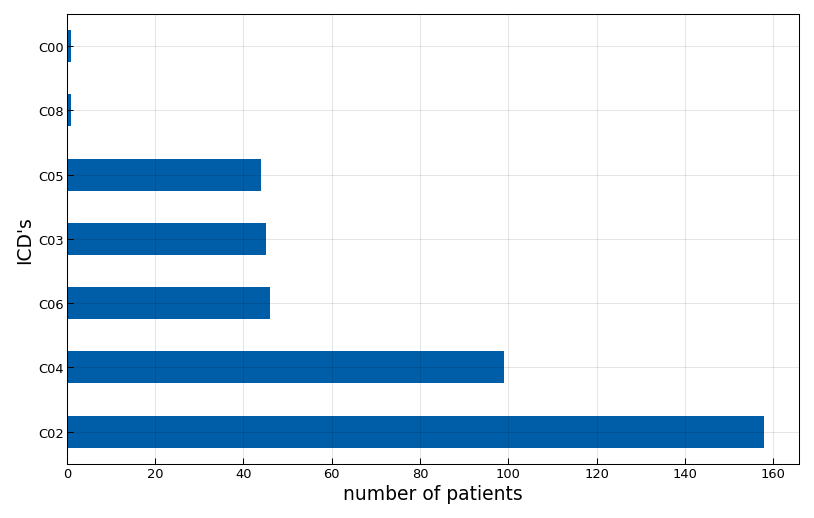

In [9]:
fig, ax = plt.subplots(1, figsize=set_size('full'))
dataset[oc_mask]["tumor", "1", "majorsubsites"].value_counts().plot(kind='barh', ax = ax)
ax.set_xlabel("number of patients")
ax.set_ylabel("ICD's")
fig.savefig(PLOT_PATH / "n_patients_icd.png")
plt.show()

In [10]:
# Neglect C00 and C08
icds_to_neglect_oc = ["C00", "C08"]
oc_icds = [i for i in OC_icds if i not in icds_to_neglect_oc]

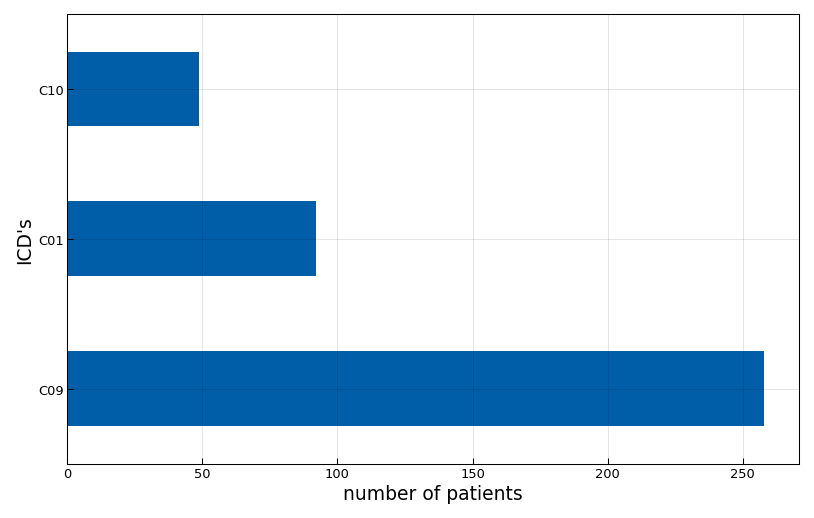

In [11]:
fig, ax = plt.subplots(1, figsize=set_size('full'))
dataset[op_mask]["tumor", "1", "majorsubsites"].value_counts().plot(kind='barh', ax = ax)
ax.set_xlabel("number of patients")
ax.set_ylabel("ICD's")
fig.savefig(PLOT_PATH / "n_patients_icd_op.png")
plt.show()

In [12]:
op_icds = OP_icds

In [17]:
# Create Masks for each ics code
all_icds = [*oc_icds, *op_icds]
oc_icd_masks = [dataset['tumor', "1", "majorsubsites"] == icd for icd in oc_icds]
op_icd_masks = [dataset['tumor', "1", "majorsubsites"] == icd for icd in op_icds]
all_icd_masks = [*oc_icd_masks, *op_icd_masks]
icds_masks_dict = {icd:  dataset['tumor', "1", "majorsubsites"] == icd for icd in all_icds}

### Check the prevalence vector for each, to define the graph structure which makes sense

In [18]:
lnls_full = ['I', 'II', 'III', 'IV', 'V']

In [19]:
prev_oc = create_prev_vectors(dataset[oc_mask], lnls_full, t_stages = ['all'], full_involvement=True, plot=False,)
prev_op = create_prev_vectors(dataset[op_mask], lnls_full, t_stages = ['all'], full_involvement=True, plot=False,)

prev_oc_icds = [create_prev_vectors(dataset[oc_icd_masks[i]], lnls_full, t_stages = ['all'], full_involvement=True) for i in range(len(oc_icd_masks))]
prev_op_icds = [create_prev_vectors(dataset[op_icd_masks[i]], lnls_full, t_stages = ['all'], full_involvement=True) for i in range(len(op_icd_masks))]


Prev Vector: [0.20050761421319796, 0.2918781725888325, 0.12436548223350254, 0.03807106598984772, 0.027918781725888325]
Prev Vector: [0.07769423558897243, 0.706766917293233, 0.2832080200501253, 0.09273182957393483, 0.09774436090225563]
Prev Vector: [0.13291139240506328, 0.34177215189873417, 0.16455696202531644, 0.06329113924050633, 0.05063291139240506]
Prev Vector: [0.37777777777777777, 0.2, 0.0, 0.0, 0.0]
Prev Vector: [0.2222222222222222, 0.23232323232323232, 0.1414141414141414, 0.0, 0.020202020202020204]
Prev Vector: [0.1590909090909091, 0.36363636363636365, 0.11363636363636363, 0.09090909090909091, 0.022727272727272728]
Prev Vector: [0.2391304347826087, 0.2608695652173913, 0.06521739130434782, 0.021739130434782608, 0.0]
Prev Vector: [0.08695652173913043, 0.8152173913043478, 0.2391304347826087, 0.08695652173913043, 0.021739130434782608]
Prev Vector: [0.06976744186046512, 0.6937984496124031, 0.2751937984496124, 0.10077519379844961, 0.12403100775193798]
Prev Vector: [0.10204081632653061

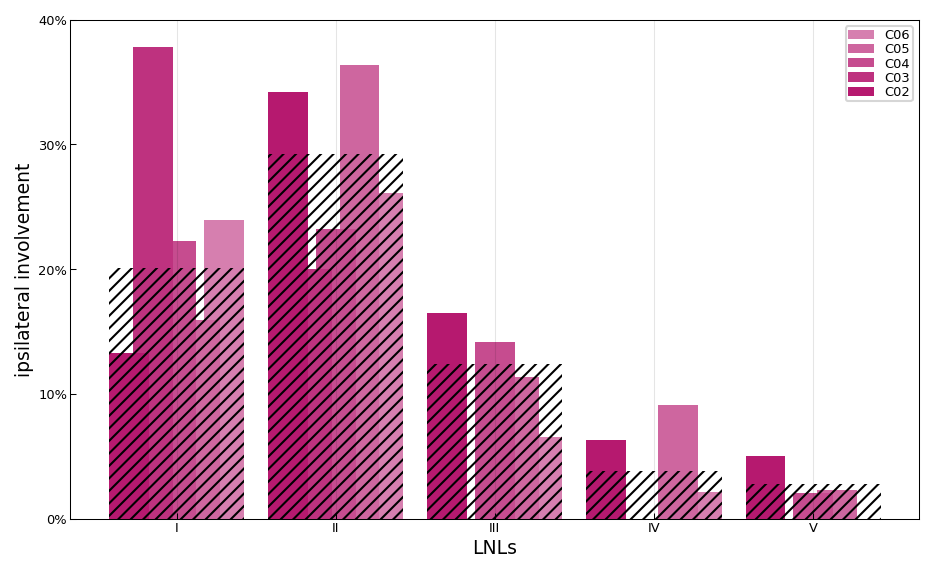

In [20]:
icds_codes = oc_icds
x_labels  = lnls_full
# colors = [usz_blue, usz_red, usz_orange,]
colors_oc = ['#b6196f', '#be327f', '#c64c8f', '#ce669f', '#d67faf', '#de99bf', '#e6b2cf', '#eeccdf', '#f6e5ef', '#ffffff']


w_data, sp = 0.85, 0.15
overlap = 0.2
w_icd = w_data / (2*overlap + len(icds_codes)*(1-2*overlap))
icd_spacing = (w_data-w_icd)/(len(icds_codes)-1)
rel_pos_icds = [i*icd_spacing + (-w_data/2 + w_icd / 2) for i in range(len(icds_codes))]
pos     = [1+1*i for i in range(len(x_labels))]
# w_icd_fill = (w_data/len(icds_codes))
# w_icd =w_icd_fill*(1-overlap)


# rel_pos_icds = [w_icd_fill/2 + i*w_icd_fill - (w_data)/2 for i in range(len(oc_icds))]
pos_icds = [[p+rel_pos_icds[i] for p in pos] for i in range(len(oc_icds))]
# pos[1] += 0.075
# pos[2] -= 0.075

fig, ax = plt.subplots(1, 1, figsize= set_size(width='full'), tight_layout = True)
bar_kwargs = {
    "width": w_icd,
    "align": "center"
}

for i, prev_oc_icd in enumerate(prev_oc_icds[::-1]):
    j = len(prev_oc_icd) - i-1
    plt.bar(pos_icds[j], height = prev_oc_icd, color = colors_oc[j], label = icds_codes[j], **bar_kwargs)
plt.bar(pos, prev_oc, width = w_data, color = usz_red, hatch="////", alpha = 0.0)
ax.set_xticks(pos);
ax.set_xticklabels(x_labels);
ax.set_xlabel("LNLs");

ax.set_yticks(np.arange(0., 1.1*max(max(prev_oc_icds)), 0.1));
ax.set_yticklabels([f"{100*tick:.0f}%" for tick in np.arange(0., 1.1*max(max(prev_oc_icds)), 0.1)]);
ax.set_ylabel("ipsilateral involvement");
ax.grid(axis="y")
ax.legend()
plt.show()

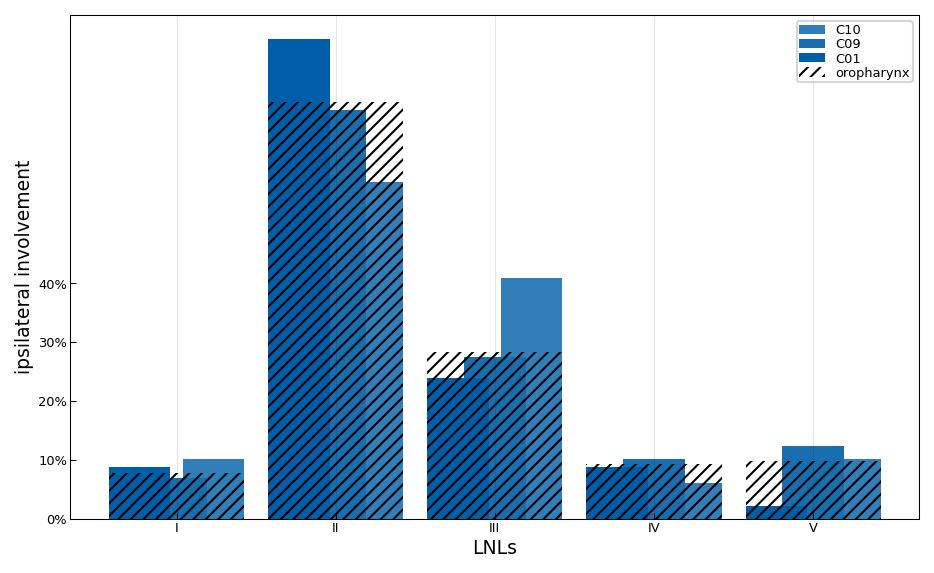

In [21]:
icds_codes = op_icds
x_labels  = lnls_full
# colors = [usz_blue, usz_red, usz_orange,]
colors_oc = ['#b6196f', '#be327f', '#c64c8f', '#ce669f', '#d67faf', '#de99bf', '#e6b2cf', '#eeccdf', '#f6e5ef', '#ffffff']
colors_oc = [
    "#005ea8",
    "#196eb0",
    "#327eb9",
    "#4c8ec2",
    "#669eca",
    "#7faed3",
    "#99bedc",
    "#b2cee4",
    "#ccdeed",
    "#e5eef6",
    "#ffffff"
]

w_data, sp = 0.85, 0.15
overlap = 0.2
w_icd = w_data / (2*overlap + len(icds_codes)*(1-2*overlap))
icd_spacing = (w_data-w_icd)/(len(icds_codes)-1)
rel_pos_icds = [i*icd_spacing + (-w_data/2 + w_icd / 2) for i in range(len(icds_codes))]
pos     = [1+1*i for i in range(len(x_labels))]
# w_icd_fill = (w_data/len(icds_codes))
# w_icd =w_icd_fill*(1-overlap)


# rel_pos_icds = [w_icd_fill/2 + i*w_icd_fill - (w_data)/2 for i in range(len(oc_icds))]
pos_icds = [[p+rel_pos_icds[i] for p in pos] for i in range(len(icds_codes))]
# pos[1] += 0.075
# pos[2] -= 0.075

fig, ax = plt.subplots(1, 1, figsize= set_size(width='full'), tight_layout = True)
bar_kwargs = {
    "width": w_icd,
    "align": "center"
}

for i, prev_op_icd in enumerate(prev_op_icds[::-1]):
    j = len(prev_op_icds) - i-1
    plt.bar(pos_icds[j], height = prev_op_icd, color = colors_oc[j], label = icds_codes[j], **bar_kwargs)
plt.bar(pos, prev_op, width = w_data, color = usz_red, label = 'oropharynx', hatch="////", alpha = 0.0)
ax.set_xticks(pos);
ax.set_xticklabels(x_labels);
ax.set_xlabel("LNLs");

ax.set_yticks(np.arange(0., 1.1*max(max(prev_oc_icds)), 0.1));
ax.set_yticklabels([f"{100*tick:.0f}%" for tick in np.arange(0., 1.1*max(max(prev_oc_icds)), 0.1)]);
ax.set_ylabel("ipsilateral involvement");
ax.grid(axis="y")
ax.legend()

Prev Vector: [0.20050761421319796, 0.2918781725888325, 0.12436548223350254, 0.03807106598984772, 0.027918781725888325]
Prev Vector: [0.07769423558897243, 0.706766917293233, 0.2832080200501253, 0.09273182957393483, 0.09774436090225563]


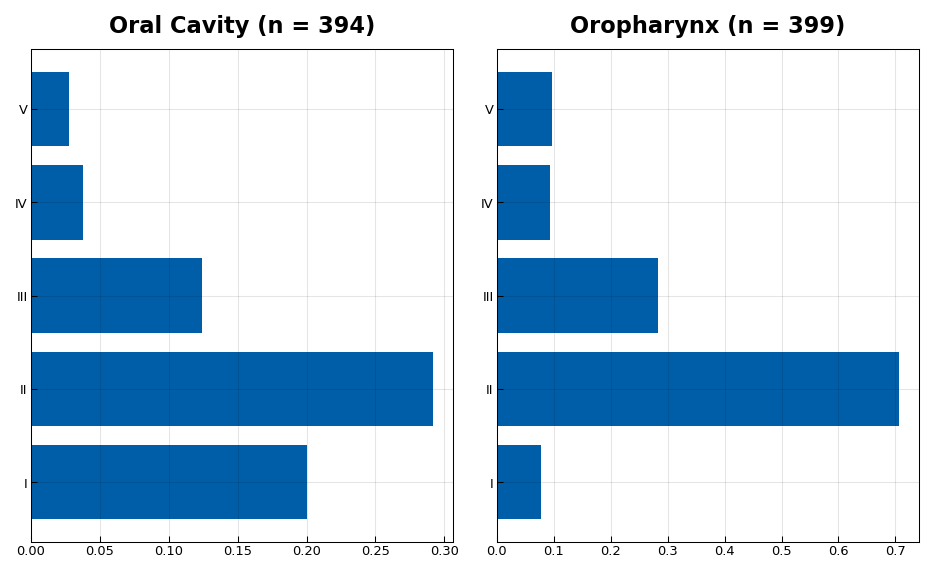

In [22]:
# Check that the data is correct
fig, ax = plt.subplots(1, 2, figsize= set_size(width='full'), tight_layout = True)
create_prev_vectors(dataset[oc_mask], lnls_full, t_stages = ['all'], full_involvement=True, plot=True, title='Oral Cavity', ax = ax[0])
create_prev_vectors(dataset[op_mask], lnls_full, t_stages = ['all'], full_involvement=True, plot=True, title='Oropharynx', ax = ax[1])
plt.show()
fig.savefig(PLOT_PATH / "prevalence_oc_op.svg")

In [23]:
# Create the table for all states
# create the patterns dataframe
lnls_4 = ['I', 'II', 'III', 'IV', 'V']
# create the patterns dataframe
states_4_all_raw = [
        list(combination) for combination in itertools.product([0, 1], repeat=len(lnls_4))
    ]
states_4_all = [
        {lnls_4[-(i + 1)]: p[i] for i in range(len(lnls_4))} for p in states_4_all_raw
    ]
prev_oc_icds = [create_prev_vectors(dataset[oc_icd_masks[i]], lnls_4, t_stages = ['all'], full_involvement=True, plot = False ) for i in range(len(oc_icd_masks))]
prev_oc_icds.append(create_prev_vectors(dataset[oc_mask], lnls_4, t_stages = ['all'], full_involvement=True, plot=False,))

pd.DataFrame(np.round(np.array(prev_oc_icds)* 100, 2), index= [*oc_icds, 'Oral Cavity'], columns = [lnls_4]).T


Prev Vector: [0.13291139240506328, 0.34177215189873417, 0.16455696202531644, 0.06329113924050633, 0.05063291139240506]
Prev Vector: [0.37777777777777777, 0.2, 0.0, 0.0, 0.0]
Prev Vector: [0.2222222222222222, 0.23232323232323232, 0.1414141414141414, 0.0, 0.020202020202020204]
Prev Vector: [0.1590909090909091, 0.36363636363636365, 0.11363636363636363, 0.09090909090909091, 0.022727272727272728]
Prev Vector: [0.2391304347826087, 0.2608695652173913, 0.06521739130434782, 0.021739130434782608, 0.0]
Prev Vector: [0.20050761421319796, 0.2918781725888325, 0.12436548223350254, 0.03807106598984772, 0.027918781725888325]


,C02,C03,C04,C05,C06,Oral Cavity
I,13.29,37.78,22.22,15.91,23.91,20.05
II,34.18,20.00,23.23,36.36,26.09,29.19
III,16.46,0.00,14.14,11.36,6.52,12.44
IV,6.33,0.00,0.00,9.09,2.17,3.81
V,5.06,0.00,2.02,2.27,0.00,2.79


In [25]:
pd.DataFrame(np.array(prev_oc_icds)* 100, index= [*oc_icds, 'Oral Cavity'], columns = [str(s) for s in lnls_4]).T

,C02,C03,C04,C05,C06,Oral Cavity
I,13.291139,37.777778,22.222222,15.909091,23.913043,20.050761
II,34.177215,20.000000,23.232323,36.363636,26.086957,29.187817
III,16.455696,0.000000,14.141414,11.363636,6.521739,12.436548
IV,6.329114,0.000000,0.000000,9.090909,2.173913,3.807107
V,5.063291,0.000000,2.020202,2.272727,0.000000,2.791878


In [27]:
prev_op_icds = [create_prev_vectors(dataset[op_icd_masks[i]], lnls_4, t_stages = ['all'], full_involvement=True, plot = False ) for i in range(len(op_icd_masks))]
prev_op_icds.append(create_prev_vectors(dataset[op_mask], lnls_4, t_stages = ['all'], full_involvement=True, plot=False,))

pd.DataFrame(np.round(np.array(prev_op_icds)* 100,2), index= [*op_icds, 'Oropharynx'], columns = [lnls_4]).T

Prev Vector: [0.08695652173913043, 0.8152173913043478, 0.2391304347826087, 0.08695652173913043, 0.021739130434782608]
Prev Vector: [0.06976744186046512, 0.6937984496124031, 0.2751937984496124, 0.10077519379844961, 0.12403100775193798]
Prev Vector: [0.10204081632653061, 0.5714285714285714, 0.40816326530612246, 0.061224489795918366, 0.10204081632653061]
Prev Vector: [0.07769423558897243, 0.706766917293233, 0.2832080200501253, 0.09273182957393483, 0.09774436090225563]


,C01,C09,C10,Oropharynx
I,8.70,6.98,10.20,7.77
II,81.52,69.38,57.14,70.68
III,23.91,27.52,40.82,28.32
IV,8.70,10.08,6.12,9.27
V,2.17,12.40,10.20,9.77


In [28]:
prev_op_icds = [create_prev_vectors(dataset[op_icd_masks[i]], lnls_4, t_stages = ['all'], full_involvement=False, plot = False ) for i in range(len(op_icd_masks))]
prev_op_icds.append(create_prev_vectors(dataset[op_mask], lnls_4, t_stages = ['all'], full_involvement=False, plot=False,))
pd.DataFrame(np.array(prev_op_icds)* 100, index= [*op_icds, 'Oropharynx'], columns = [str(s) for s in states_4_all_raw]).T


Prev Vector: [0.14130434782608695, 0.0, 0.5, 0.043478260869565216, 0.021739130434782608, 0.010869565217391304, 0.15217391304347827, 0.021739130434782608, 0.0, 0.0, 0.05434782608695652, 0.0, 0.010869565217391304, 0.0, 0.010869565217391304, 0.010869565217391304, 0.0, 0.0, 0.021739130434782608, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Prev Vector: [0.23255813953488372, 0.003875968992248062, 0.3798449612403101, 0.023255813953488372, 0.03875968992248062, 0.0, 0.10465116279069768, 0.015503875968992248, 0.003875968992248062, 0.0, 0.007751937984496124, 0.003875968992248062, 0.003875968992248062, 0.0, 0.050387596899224806, 0.007751937984496124, 0.015503875968992248, 0.0, 0.046511627906976744, 0.0, 0.007751937984496124, 0.0, 0.023255813953488372, 0.007751937984496124, 0.0, 0.0, 0.007751937984496124, 0.0, 0.0, 0.0, 0.007751937984496124, 0.007751937984496124]
Prev Vector: [0.20408163265306123, 0.02040816326530612, 0.22448979591836735, 0.061224489795918366, 0.122448979591836

,C01,C09,C10,Oropharynx
"[0, 0, 0, 0, 0]",14.130435,23.255814,20.408163,20.802005
"[0, 0, 0, 0, 1]",0.000000,0.387597,2.040816,0.501253
"[0, 0, 0, 1, 0]",50.000000,37.984496,22.448980,38.847118
"[0, 0, 0, 1, 1]",4.347826,2.325581,6.122449,3.258145
"[0, 0, 1, 0, 0]",2.173913,3.875969,12.244898,4.511278
"[0, 0, 1, 0, 1]",1.086957,0.000000,0.000000,0.250627
"[0, 0, 1, 1, 0]",15.217391,10.465116,18.367347,12.531328
"[0, 0, 1, 1, 1]",2.173913,1.550388,0.000000,1.503759
"[0, 1, 0, 0, 0]",0.000000,0.387597,0.000000,0.250627
"[0, 1, 0, 0, 1]",0.000000,0.000000,0.000000,0.000000


In [29]:
pd.DataFrame(prev_oc_icds, index= [*oc_icds, 'Oral Cavity']).T.to_csv("./prevalences/oc_4lnls_icds.csv")

## Model Definitions

In [30]:

graph_4lnl = {
            ("tumor", "primary"): ["I", "II", "III", 'IV'],
            ("lnl", "I"): [],
            ("lnl", "II"): ["I", "III"],
            ("lnl", "III"): ['IV'],
            ("lnl", "IV"): [],
        }


## Independent prediction for OC and HP

In [44]:
import scipy as sp
model_OC = create_models(1, graph_4lnl, ignore_t_stage=True)
model_OC.load_patient_data(dataset[oc_mask], mapping=lambda x: 'all', side = 'ipsi')
n_params = len(model_OC.get_params())


model_OP = create_models(1, graph_4lnl, ignore_t_stage=True)
model_OP.load_patient_data(dataset[op_mask], mapping=lambda x: 'all')
n_params = len(model_OP.get_params())
print(model_OP.get_params())


dict_values([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0])


In [45]:
def log_prob_fn(theta):
    global MODEL
    for t in theta:
        if t<0 or 1<t:
            return -10000
    llh = MODEL.likelihood(given_param_args = theta, log=True)
    if np.isnan(llh):
        llh = -10000
    if np.isinf(llh):
        llh = -10000
    return llh

In [46]:
# Sampling
global MODEL
MODEL = model_OC
sample_name = f"oc_1234_ignore_t"
sampling = False
if sampling:
    samples_oc, end_point, llh = emcee_sampling_ext(log_prob_fn, n_params, sample_name, n_burnin = 750, n_step = 500, llh_args = [])
else:
    samples_oc = np.load("samples/"+sample_name+".npy")

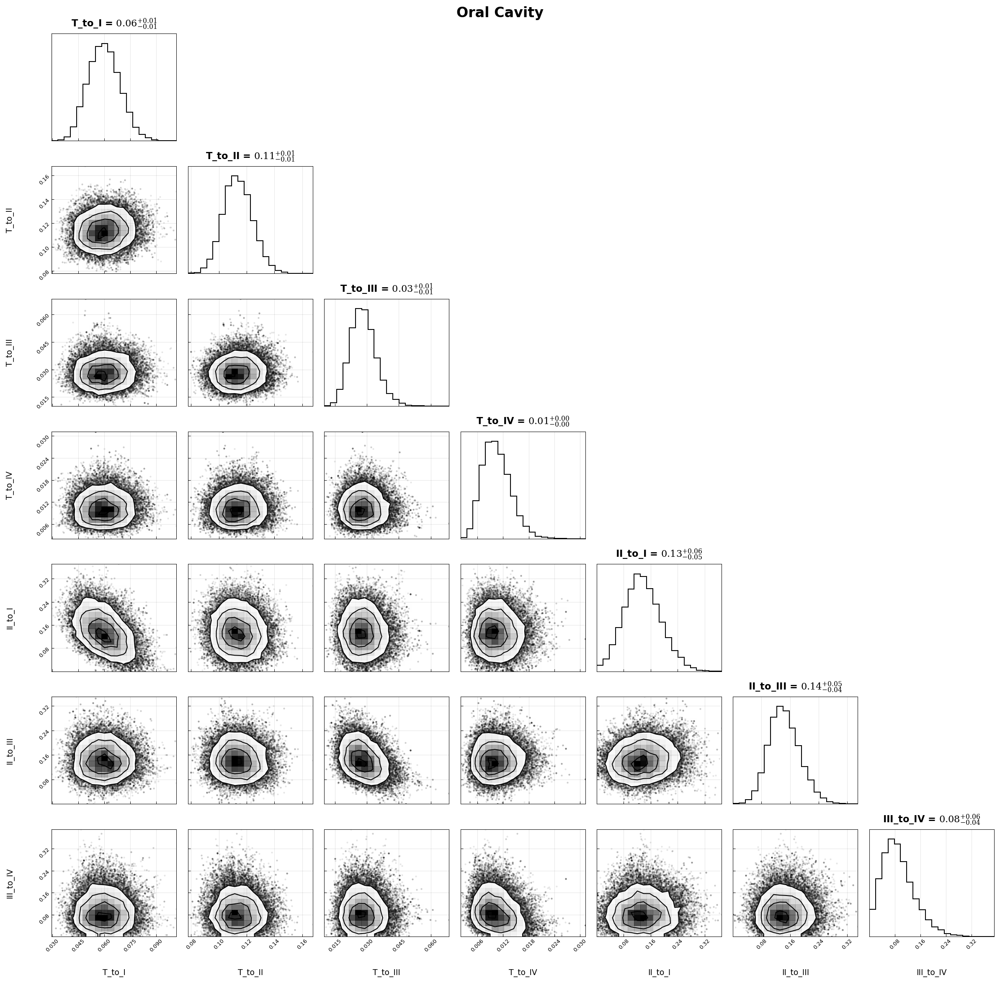

In [49]:
label_ts = [t.replace('primary', "T").replace('_spread', '') for t in MODEL.get_params(as_dict = True).keys()]
fig = corner.corner(
        samples_oc,
        labels=label_ts,
        show_titles=True,
    )
fig.suptitle(f'Oral Cavity', fontsize=16)
fig.tight_layout()
plt.show()

In [50]:
# Sampling
global MODEL
MODEL = model_OP
sample_name = f"op_1234_ignore_t"
sampling = False
if sampling:
    samples_op, end_point, llh = emcee_sampling_ext(log_prob_fn, n_params, sample_name, n_burnin = 750, n_step = 500, llh_args = [])
else:
    samples_op = np.load("samples/"+sample_name+".npy")

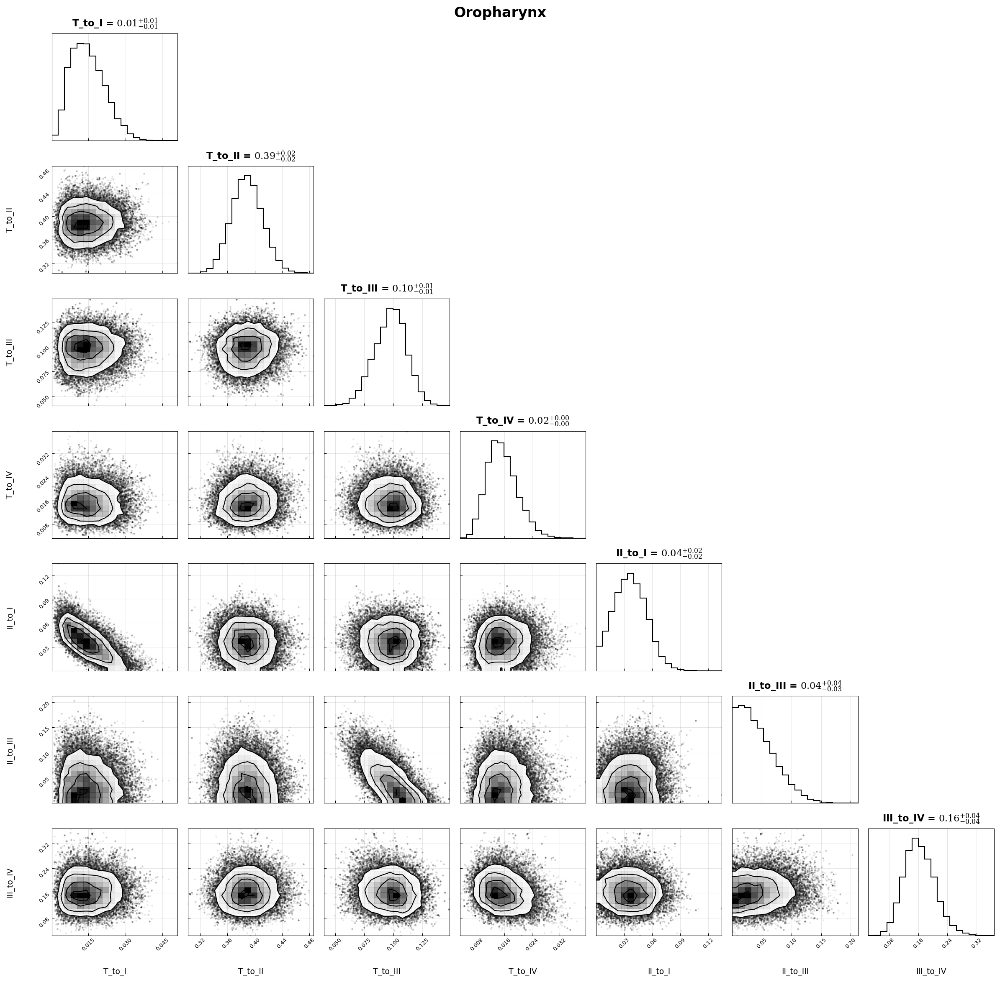

In [51]:
label_ts = [t.replace('primary', "T").replace('_spread', '') for t in MODEL.get_params(as_dict = True).keys()]
fig = corner.corner(
        samples_op,
        labels=label_ts,
        show_titles=True,
    )
fig.suptitle(f'Oropharynx', fontsize=16)
fig.tight_layout()
plt.show()

## MM for icd based prediction

In [52]:
def emcee_sampling_ext_em(log_prob_fn, n_params = None, sample_name = None, n_burnin = None, n_step = None, start_with = None, skip_burnin = False, llh_args=None):

    nwalkers = 20*n_params
    burnin = 1000 if n_burnin is None else n_burnin
    nstep = 1000 if n_step is None else n_step
    thin_by = 1
    print(f"Dimension: {n_params} with n walkers: {nwalkers}")
    output_name = sample_name

    if False:
        samples = np.load("samples/expl_oc_hp/em/"+output_name+".npy")
    else:
        created_pool = mp.Pool(os.cpu_count())
        with created_pool as pool:
            if start_with is None:
                starting_points = np.random.uniform(size=(nwalkers, n_params))
            else:
                if np.shape(start_with) != np.shape(np.random.uniform(size=(nwalkers, n_params))):
                    starting_points = np.tile(start_with, (nwalkers, 1))
                else:
                    starting_points = start_with
            print(f"Start Burning (steps = {burnin}) with {created_pool._processes} cores")
            burnin_sampler = emcee.EnsembleSampler(
                nwalkers,
                n_params,
                log_prob_fn,
                args=llh_args,
                pool=pool,
            )
            burnin_results = burnin_sampler.run_mcmc(
                initial_state=starting_points, nsteps=burnin, progress=True
            )
            
            ar = np.mean(burnin_sampler.acceptance_fraction)
            print(f"the HMM sampler for model 01 accepted {ar * 100 :.2f} % of samples.")
            starting_points = burnin_sampler.get_last_sample()[0]
            # print(f"The shape of the last sample is {starting_points.shape}")
            original_sampler_mp = emcee.EnsembleSampler(
                nwalkers,
                n_params,
                log_prob_fn,
                args=llh_args,
                backend=None,
                pool=pool,
            )
            sampling_results = original_sampler_mp.run_mcmc(
                initial_state=starting_points, nsteps=nstep, progress=True, thin_by = thin_by
            )

        ar = np.mean(original_sampler_mp.acceptance_fraction)
        print(f"the HMM sampler for model accepted {ar * 100 :.2f} % of samples.")
        samples = original_sampler_mp.get_chain(flat=True)
        log_probs = original_sampler_mp.get_log_prob(flat=True)
        end_point = original_sampler_mp.get_last_sample()[0]
        if output_name is not None:
            np.save(f"./samples/expl_oc_hp/em/" + output_name, samples)
        # plots["acor_times"].append(burnin_info["acor_times"][-1])
        # plots["accept_rates"].append(burnin_info["accept_rates"][-1])
    return samples, end_point, log_probs

def plot_history(history, labels_w):

    weights_hist = history["z_samples"]
    model_params_hist = history["thetas"]
    llh_hist = history["log_probs"]
    c_r = history["convergence_criteria_values"]

    fig, axs = plt.subplots(2,2, figsize = set_size(width='full'))
    # Inspect llh
    axs[0][0].plot(range(len(llh_hist)), llh_hist, label = 'Likelihood')
    axs[0][0].set_xlabel('Steps')
    axs[0][0].set_ylabel('log lh')

    ax = axs[0][1]
    for i, l in enumerate(labels_w):
        ax.plot(range(len(weights_hist)), [w[i] for w in weights_hist], label = r'$\pi_{%s,0}$' % (l))
    ax.set_xlabel('Steps')
    ax.set_ylabel('weights')
    ax.legend()

    # Inspect llh
    ax = axs[1,0]
    label_ts = [t.replace('primary', "T").replace('_spread', '') for t in MODELS[0].get_params(as_dict = True).keys() if 'primary' in t]
    label_ts = [item for item in label_ts for _ in range(N_CLUSTERS)]
    # label_names_1 = [r'$b_1^{1}$', r'$b_2^{1}$', r'$b_3^{1}$', r'$t_{21}^{1}$', r'$t_{23}^{1}$', r'$p_{late}^{1}$']
    # label_names_2 = [r'$b_1^{2}$', r'$b_2^{2}$', r'$b_3^{2}$', r'$t_{21}^{2}$', r'$t_{23}^{2}$', r'$p_{late}^{2}$']
    for i in range(0, len(label_ts), N_CLUSTERS):
        for j in range(N_CLUSTERS):
            ax.plot(range(len(model_params_hist)), [w[i+j] for w in model_params_hist], label = r'%s$^{%s}$' % (label_ts[i], j))
            i_last = i


    ax.set_xlabel('Steps')
    ax.set_ylabel('model params')
    ax.legend()

        # Inspect llh
    ax = axs[1][1]
    label_ts = [t.replace('primary', "T").replace('_spread', '') for t in MODELS[0].get_params(as_dict = True).keys() if 'primary' not in t]
    label_ts = [item for item in label_ts for _ in range(N_CLUSTERS)]
    # label_names_1 = [r'$b_1^{1}$', r'$b_2^{1}$', r'$b_3^{1}$', r'$t_{21}^{1}$', r'$t_{23}^{1}$']
    # label_names_2 = [r'$b_1^{2}$', r'$b_2^{2}$', r'$b_3^{2}$', r'$t_{21}^{2}$', r'$t_{23}^{2}$']
    for i in range(0, len(label_ts), N_CLUSTERS):
        for j in range(N_CLUSTERS):
            ax.plot(range(len(model_params_hist)), [w[i+j+i_last] for w in model_params_hist], label = r'%s$^{%s}$' % (label_ts[i], j))
        
    ax.set_xlabel('Steps')
    ax.set_ylabel('model params')
    ax.legend()
    plt.show()


In [53]:
def assign_mixing_parameters(z):
    """
    Assigns mixing parameters(latent variables) to models.
    z_s,k, where s is subsite and k is cluster
    Structure [z_11, z_12, .. , z1(K-1), z21, .., z2(K-1), .. , zS(K-1)]
    """
    global MODELS, N_CLUSTERS
    z_grouped = [z[i:i+(N_CLUSTERS-1)] for i in range(0, len(MODELS), N_CLUSTERS-1)]
    z_grouped = [[*zs, 1-np.sum(zs)] for zs in z_grouped]
    for i, model in enumerate(MODELS):
        model.mixture_components = z_grouped[i]

def assign_model_params(theta):
    global MODELS, N_CLUSTERS
    theta_grouped = [list(theta[i:i + N_CLUSTERS]) for i in range(0, len(theta), N_CLUSTERS)]
    for model in MODELS:
        model.assign_params(*theta_grouped)

def llh_z_given_theta(z, inverted = False):
    global MODELS, N_CLUSTERS
    # For now works only with 2 clusters
    for zs in z:
        if zs < 0 or 1 < zs:
            return 10000 if inverted else -10000
    llh = 0
    for i, model in enumerate(MODELS):
        model.mixture_components = [z[i], 1 - z[i]]
        llh += model._hmm_likelihood(log=True)
    if inverted: 
        return -llh
    else:
        return llh

def perform_expectation(theta, step, last_sample, n_clusters = 2):
    """
    compute p(z|\theta^{i}, x)
    """
    global MODELS, N_CLUSTERS

    # Sampling definitions
    n_burnin = 300
    n_step = 100
    # assign theta to the models (actually, the model can do this already by its own)
    theta_grouped = [[theta[i+j] for j in range(N_CLUSTERS)] for i in range(0, len(theta), N_CLUSTERS)]
    for model in MODELS:
        model.assign_params(*theta_grouped)
    
    n_params = (N_CLUSTERS -1)*len(MODELS)
    z_posterior, last_sample, log_probs = emcee_sampling_ext_em(llh_z_given_theta, n_params, sample_name = f"exp_{step}", n_burnin=n_burnin, n_step=n_step, start_with = last_sample)
    return z_posterior, last_sample, log_probs


def q_function(theta, z_samples, inverted = False):
    global MODELS
    for t in theta:
        if t<0 or 1<t:
            return -10000 if not inverted else 10000
    llh = 0
    # assign_model_params(theta)
    for z_sample in z_samples:
        if len(z_samples)>1:
            assign_mixing_parameters(z_sample)
        for model in MODELS:
            llh += model.likelihood(given_param_args = theta, log=True)
    llh = llh/len(z_samples)
    return (-1)**(inverted) * llh
    

def perform_maximization(z_samples: list[list[float]], step, method = 'MC', minimize_method = "L-BFGS-B"):
    "return theta which maximizes the q function"
    global MODELS
    # Sampling definitions
    n_burnin = 300
    n_step = 100

    n_params = len(MODELS[0].get_params()) * N_CLUSTERS

    if len(z_samples) == 1:
        for z_sample in z_samples:
            assign_mixing_parameters(z_sample)
    if method == 'MC':
        theta_samples, last_theta_samples, log_probs = emcee_sampling_ext_em(q_function, n_params, sample_name = f"maximization_{step}", n_burnin=n_burnin, n_step=n_step, llh_args=[z_samples])
        theta_max = theta_samples[log_probs.argmax()]
        log_probs_max = log_probs.max()
    else:
        initial_guess = np.random.random(n_params)
        param_bounds = [(0,1)]*n_params
        res = minimize(
            q_function,
            initial_guess,
            args=(z_samples, True),
            method=minimize_method,
            bounds=param_bounds,
        )
        theta_max = res.x
        log_probs_max = - res.fun
    
    return theta_max, log_probs_max
    

def find_optimal_weights(n_steps = 20, m_imputations = 3, convergence_ths = 0.015, minimize_method = 'SLSQP', theta_initial = None, name=''):
    global MODELS
    # Initialize the weights
    z_samples_initial = [0.5]*(N_CLUSTERS - 1) * len(MODELS)
    theta_im = theta_initial # initially set to None
    last_sample_exp = None

    history = {"z_samples" : [],
    "thetas" : [],
    "log_probs" : [],
    "convergence_criteria_values" : [],}
    
    for step in range(n_steps):
        print(f"Step {step} " + "- " * 20)

        if isinstance(m_imputations, int):
            m_imputations_i = m_imputations
        else:
            m_imputations_i = m_imputations(step)
        # Expectation
        if theta_im is not None:
            print(f"Performing expectation with {m_imputations_i} imputations.. ")
            llhs_e = []
            weights_e = []
            z_posterior, last_sample_exp, log_probs = perform_expectation(theta_im, step, last_sample=last_sample_exp)

            z_samples = z_posterior[np.random.choice(z_posterior.shape[0], m_imputations_i, replace=False)]

            print(f"    Pi's: {z_samples}")
            np.save(f"./samples/expl_oc_hp/em/" + f"{name}_z_samples_{step}", z_samples) 
        else:
            z_samples = [z_samples_initial]  

        # Maximation
        print("Performing maximization: ")

        theta_i, log_prob_i = perform_maximization(z_samples, step, method = 'MLE', minimize_method=minimize_method)

        print(f"    theta_i: {theta_i}")

        # Store the data in dict
        if step > 0:
            history["z_samples"].append(z_posterior.mean(axis = 0))
        else:
            history["z_samples"].append(np.array(z_samples[0]))
        history["thetas"].append(theta_i)
        history["log_probs"].append(log_prob_i)

        theta_im = theta_i

        # convergence criteria
        converged = False
        try:
            n_steps_for_convergence = 3
            convergence_ths = 0.015
            last_thetas_array = np.array(history["thetas"][-n_steps_for_convergence:])
            reference_theta_line = last_thetas_array.sum(axis = 0)/n_steps_for_convergence
            squared_differences = (last_thetas_array-reference_theta_line)**2
            history["convergence_criteria_values"].append(np.sqrt(squared_differences.max()))
            converged = (squared_differences<convergence_ths**2).all()
        except:
            history["convergence_criteria_values"].append(0)
            pass
        if converged:
            print(f"Condition Fullfilled at step {step}")
            break
    np.save(f"./samples/expl_oc_hp/em/" + f"{name}_final_history_{step}_{n_steps}_{minimize_method}", z_samples) 
    return z_samples, theta_i, history

In [54]:
def plot_history_inverted(history, labels_w):

    weights_hist = history["weights"]
    model_params_hist = history["theta_samples"]
    llh_hist = history["log_probs"]
    c_r = history["convergence_criteria_values"]

    fig, axs = plt.subplots(2,2, figsize = set_size(width='full'))
    # Inspect llh
    axs[0][0].plot(range(len(llh_hist)), llh_hist, label = 'Likelihood')
    axs[0][0].set_xlabel('Steps')
    axs[0][0].set_ylabel('log lh')

    ax = axs[0][1]
    for i, l in enumerate(labels_w):
        ax.plot(range(len(weights_hist)), [w[i] for w in weights_hist], label = r'$\pi_{%s,0}$' % (l))
    ax.set_xlabel('Steps')
    ax.set_ylabel('weights')
    ax.legend()

    # Inspect llh
    ax = axs[1,0]
    label_ts = [t.replace('primary', "T").replace('_spread', '') for t in MODELS[0].get_params(as_dict = True).keys() if 'primary' in t]
    label_ts = [item for item in label_ts for _ in range(N_CLUSTERS)]
    # label_names_1 = [r'$b_1^{1}$', r'$b_2^{1}$', r'$b_3^{1}$', r'$t_{21}^{1}$', r'$t_{23}^{1}$', r'$p_{late}^{1}$']
    # label_names_2 = [r'$b_1^{2}$', r'$b_2^{2}$', r'$b_3^{2}$', r'$t_{21}^{2}$', r'$t_{23}^{2}$', r'$p_{late}^{2}$']
    for i in range(0, len(label_ts), N_CLUSTERS):
        for j in range(N_CLUSTERS):
            ax.plot(range(len(model_params_hist)), [w[i+j] for w in model_params_hist], label = r'%s$^{%s}$' % (label_ts[i], j))
            i_last = i


    ax.set_xlabel('Steps')
    ax.set_ylabel('model params')
    ax.legend()

        # Inspect llh
    ax = axs[1][1]
    label_ts = [t.replace('primary', "T").replace('_spread', '') for t in MODELS[0].get_params(as_dict = True).keys() if 'primary' not in t]
    label_ts = [item for item in label_ts for _ in range(N_CLUSTERS)]
    # label_names_1 = [r'$b_1^{1}$', r'$b_2^{1}$', r'$b_3^{1}$', r'$t_{21}^{1}$', r'$t_{23}^{1}$']
    # label_names_2 = [r'$b_1^{2}$', r'$b_2^{2}$', r'$b_3^{2}$', r'$t_{21}^{2}$', r'$t_{23}^{2}$']
    for i in range(0, len(label_ts), N_CLUSTERS):
        for j in range(N_CLUSTERS):
            ax.plot(range(len(model_params_hist)), [w[i+j+i_last] for w in model_params_hist], label = r'%s$^{%s}$' % (label_ts[i], j))
        
    ax.set_xlabel('Steps')
    ax.set_ylabel('model params')
    ax.legend()
    plt.show()


def assign_mixing_parameters(z):
    """
    Assigns mixing parameters(latent variables) to models.
    z_s,k, where s is subsite and k is cluster
    Structure [z_11, z_12, .. , z1(K-1), z21, .., z2(K-1), .. , zS(K-1)]
    """
    global MODELS, N_CLUSTERS
    z_grouped = [z[i:i+(N_CLUSTERS-1)] for i in range(0, len(MODELS), N_CLUSTERS-1)]
    z_grouped = [[*zs, 1-np.sum(zs)] for zs in z_grouped]
    for i, model in enumerate(MODELS):
        model.mixture_components = z_grouped[i]

def assign_model_params(theta):
    global MODELS, N_CLUSTERS
    theta_grouped = [list(theta[i:i + N_CLUSTERS]) for i in range(0, len(theta), N_CLUSTERS)]
    for model in MODELS:
        model.assign_params(*theta_grouped)

def llh_theta_given_z(z, thetas, inverted = False):
    global MODELS, N_CLUSTERS
    # For now works only with 2 clusters
    for zs in z:
        if zs < 0 or 1 < zs:
            return 10000 if inverted else -10000
    llh = 0
    for theta in thetas:
        theta_grouped = [[theta[i+j] for j in range(N_CLUSTERS)] for i in range(0, len(theta), N_CLUSTERS)]
        for i, model in enumerate(MODELS):
            model.assign_params(*theta_grouped)
            model.mixture_components = [z[i], 1 - z[i]]
            llh += model._hmm_likelihood(log=True)

    llh = llh/len(thetas)
    if inverted: 
        return -llh
    else:
        return llh

def perform_maximation_inverted(thetas, step, method = 'MLE', minimize_method = 'Powell'):
    """
    compute p(z|\theta^{i}, x)
    """
    global MODELS, N_CLUSTERS

    # Sampling definitions

    n_params = (N_CLUSTERS -1)*len(MODELS)
    initial_guess = np.random.random(n_params)
    param_bounds = [(0,1)]*n_params
    res = minimize(
        llh_theta_given_z,
        initial_guess,
        args=(thetas, True),
        method=minimize_method,
        bounds=param_bounds,
    )
    z_max = res.x
    log_probs_max = - res.fun
    return z_max, log_probs_max


def q_function(theta, z_samples, inverted = False):
    global MODELS
    for t in theta:
        if t<0 or 1<t:
            return -10000 if not inverted else 10000
    llh = 0
    # assign_model_params(theta)
    for z_sample in z_samples:
        if len(z_samples)>1:
            assign_mixing_parameters(z_sample)
        for model in MODELS:
            llh += model.likelihood(given_param_args = theta, log=True)
    llh = llh/len(z_samples)
    return (-1)**(inverted) * llh
    

def perform_expectation_inverted(z_samples: list[list[float]], step, n_burnin = 400, n_step = 200, method = 'MC', minimize_method = "L-BFGS-B"):
    "return theta which maximizes the q function"
    global MODELS
    # Sampling definitions

    n_params = len(MODELS[0].get_params()) * N_CLUSTERS

    if len(z_samples) == 1:
        assign_mixing_parameters(z_samples[0])
    if method == 'MC':
        theta_samples, last_theta_samples, log_probs = emcee_sampling_ext_em(q_function, n_params, sample_name = f"maximization_{step}", n_burnin=n_burnin, n_step=n_step, llh_args=[z_samples])
        theta_max = theta_samples[log_probs.argmax()]
        log_probs_max = log_probs.max()
    else:
        initial_guess = np.random.random(n_params)
        param_bounds = [(0,1)]*n_params
        res = minimize(
            q_function,
            initial_guess,
            args=(z_samples, True),
            method=minimize_method,
            bounds=param_bounds,
        )
        theta_max = res.x
        log_probs_max = - res.fun
    
    return theta_samples, last_theta_samples, log_probs


def find_optimal_weights_inverted(n_steps = 20, m_imputations = 3, convergence_ths = 0.015, minimize_method = 'Powell', theta_initial = None):
    global MODELS
    # Initialize the weights
    theta_initial = [0.5]* len(MODELS[0].get_params()) * N_CLUSTERS
    
    z_im = None # initially set to None
    last_sample_exp = None

    history = {"theta_samples" : [],
    "weights" : [],
    "log_probs" : [],
    "convergence_criteria_values" : [],}
    
    for step in range(n_steps):
        print(f"Step {step} " + "- " * 20)

        if isinstance(m_imputations, int):
            m_imputations_i = m_imputations
        else:
            m_imputations_i = m_imputations(step)
        # Expectation
        if z_im is not None:
            print(f"Performing expectation with {m_imputations_i} imputations.. ")
            llhs_e = []
            thetas_e = []
            theta_posterior, last_sample_exp, log_probs = perform_expectation_inverted([z_im], step, n_burnin=500, n_step = 100)

            theta_samples = theta_posterior[np.random.choice(theta_posterior.shape[0], m_imputations_i, replace=False)]

            print(f"    thetas's: {theta_samples}")
            np.save(f"./samples/expl_oc_hp/em/" + f"thetas_samples_inv_{step}", theta_samples) 
        else:
            theta_samples = [theta_initial]  

        # Maximation
        print("Performing maximization: ")

        z_i, log_prob_i = perform_maximation_inverted(theta_samples, step, method = 'MLE', minimize_method=minimize_method)

        print(f"    z_i: {z_i}")

        # Store the data in dict
        if step > 0:
            history["theta_samples"].append(theta_posterior.mean(axis = 0))
        else:
            history["theta_samples"].append(np.array(theta_samples[0]))
        history["weights"].append(z_i)
        history["log_probs"].append(log_prob_i)

        z_im = z_i

        # convergence criteria
        converged = False
        try:
            n_steps_for_convergence = 3
            convergence_ths = 0.015
            last_z_array = np.array(history["weights"][-n_steps_for_convergence:])
            reference_theta_line = last_z_array.sum(axis = 0)/n_steps_for_convergence
            squared_differences = (last_z_array-reference_theta_line)**2
            history["convergence_criteria_values"].append(np.sqrt(squared_differences.max()))
            converged = (squared_differences<convergence_ths**2).all()
            print(f"Convergence Max value: {(squared_differences).max()}")
        except:
            history["convergence_criteria_values"].append(0)
            pass
        if converged:
            print(f"Condition Fullfilled at step {step}")
            break
    return theta_samples, z_i, history

In [55]:
global MODELS, N_CLUSTERS

n_subsites = len(all_icds)
n_clusters = 2

models_MM = create_models(n_subsites, graph_4lnl, ignore_t_stage=True, n_mixture_components=n_clusters)
for i, (k,v) in enumerate(icds_masks_dict.items()):
    models_MM[i].load_patient_data(dataset[v], mapping = lambda x: 'all')
    print(f"Loaded patients for ICD {k} (total {v.sum()} patients)")

MODELS = models_MM
N_CLUSTERS = n_clusters

Loaded patients for ICD C02 (total 158 patients)
Loaded patients for ICD C03 (total 45 patients)
Loaded patients for ICD C04 (total 99 patients)
Loaded patients for ICD C05 (total 44 patients)
Loaded patients for ICD C06 (total 46 patients)
Loaded patients for ICD C01 (total 92 patients)
Loaded patients for ICD C09 (total 258 patients)
Loaded patients for ICD C10 (total 49 patients)


## Unused

In [ ]:
m_imputations_fun = lambda x: int(5/(20)*x + 1)

In [30]:
z_samples, theta_samples, history = find_optimal_weights(m_imputations = m_imputations_fun, n_steps = 20, convergence_ths= 0.01)

Step 0 - - - - - - - - - - - - - - - - - - - - 
Performing maximization: 
    theta_i: [0.00000000e+00 4.82355208e-02 6.09842566e-01 4.77153983e-02
 8.94218313e-02 3.98195782e-02 1.48484221e-02 8.16423242e-03
 8.60583142e-02 1.04920956e-01 7.75026690e-11 5.31036118e-01
 2.43802678e-01 3.29178454e-11]
Step 1 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 1 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [00:32<00:00,  9.13it/s]


the HMM sampler for model 01 accepted 44.77 % of samples.


100%|██████████| 100/100 [00:11<00:00,  9.00it/s]


the HMM sampler for model accepted 44.92 % of samples.
    Pi's: [[0.30722925 0.17026146 0.04022717 0.45350025 0.35853695 0.80998431
  0.82781118 0.60439826]]
Performing maximization: 
    theta_i: [5.80669811e-10 5.33776629e-02 5.00997983e-01 6.18593255e-02
 1.11044381e-01 3.08648752e-02 1.60533297e-02 6.93019123e-03
 5.48250828e-02 4.42849191e-01 2.83659116e-10 1.27579181e-01
 1.82392636e-01 2.29625209e-10]
Step 2 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 1 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [00:30<00:00,  9.97it/s]


the HMM sampler for model 01 accepted 40.56 % of samples.


100%|██████████| 100/100 [00:09<00:00, 10.25it/s]


the HMM sampler for model accepted 39.38 % of samples.
    Pi's: [[0.29949611 0.03755992 0.11005735 0.39909284 0.05305505 0.93622604
  0.93872752 0.45170194]]
Performing maximization: 
    theta_i: [3.26507386e-13 5.81686681e-02 4.46442159e-01 6.66155968e-02
 1.01630326e-01 3.01177141e-02 1.54871486e-02 7.55573903e-03
 5.38479016e-02 4.56441507e-01 1.85625439e-02 1.12247586e-01
 1.74249737e-01 2.15901666e-13]
Step 3 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 1 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [00:29<00:00, 10.20it/s]


the HMM sampler for model 01 accepted 39.92 % of samples.


100%|██████████| 100/100 [00:09<00:00, 10.17it/s]


the HMM sampler for model accepted 39.63 % of samples.
    Pi's: [[0.25684113 0.00969568 0.12268486 0.39081895 0.10028176 0.94569657
  0.91659094 0.78704807]]
Performing maximization: 
    theta_i: [9.16324764e-05 5.82842152e-02 4.45296584e-01 6.36175051e-02
 1.11345780e-01 2.60408016e-02 1.49582291e-02 7.88778839e-03
 5.53478545e-02 4.88636119e-01 0.00000000e+00 1.17800701e-01
 1.65087751e-01 0.00000000e+00]
Step 4 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 2 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [00:30<00:00,  9.68it/s]


the HMM sampler for model 01 accepted 39.73 % of samples.


100%|██████████| 100/100 [00:10<00:00,  9.17it/s]


the HMM sampler for model accepted 38.94 % of samples.
    Pi's: [[0.36020983 0.13614667 0.13544808 0.27285231 0.22797809 0.99185303
  0.93871711 0.73126737]
 [0.3819771  0.06174312 0.08550565 0.28136352 0.14574831 0.9274414
  0.92835776 0.75116298]]
Performing maximization: 
    theta_i: [0.00346412 0.05888898 0.4335056  0.05580445 0.10888575 0.02521502
 0.01437216 0.00788466 0.05093849 0.65356761 0.         0.12832119
 0.16313965 0.        ]
Step 5 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 2 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [00:29<00:00, 10.19it/s]


the HMM sampler for model 01 accepted 38.58 % of samples.


100%|██████████| 100/100 [00:10<00:00,  9.26it/s]


the HMM sampler for model accepted 39.95 % of samples.
    Pi's: [[0.33789264 0.03345237 0.11455692 0.48921981 0.14699966 0.97662025
  0.93916007 0.70935029]
 [0.25719749 0.03047733 0.22650171 0.14866534 0.15307296 0.97922644
  0.97625628 0.64978553]]
Performing maximization: 
    theta_i: [4.50529086e-03 5.92980892e-02 4.25948702e-01 6.01146634e-02
 1.09141107e-01 2.52911355e-02 1.44263969e-02 7.99002216e-03
 4.87618290e-02 5.70168624e-01 3.80165512e-14 1.17272777e-01
 1.61654996e-01 0.00000000e+00]
Step 6 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 2 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [00:28<00:00, 10.50it/s]


the HMM sampler for model 01 accepted 37.82 % of samples.


100%|██████████| 100/100 [00:09<00:00, 10.43it/s]


the HMM sampler for model accepted 38.02 % of samples.
    Pi's: [[0.33620206 0.00365268 0.10083765 0.36162556 0.21470653 0.90798426
  0.94243983 0.57292115]
 [0.36058784 0.0361354  0.28522761 0.32971056 0.07887312 0.99496645
  0.88902581 0.72749501]]
Performing maximization: 
    theta_i: [3.56814208e-03 5.75424691e-02 4.44940310e-01 5.46298625e-02
 1.09511902e-01 2.59608572e-02 1.45722396e-02 7.90881080e-03
 4.80148864e-02 7.30226803e-01 1.16469370e-12 1.26107387e-01
 1.63378730e-01 1.98621460e-12]
Step 7 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 2 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [00:28<00:00, 10.59it/s]


the HMM sampler for model 01 accepted 39.22 % of samples.


100%|██████████| 100/100 [00:10<00:00,  9.97it/s]


the HMM sampler for model accepted 38.61 % of samples.
    Pi's: [[0.3152236  0.01126767 0.09524896 0.44605894 0.18915181 0.96944742
  0.90746119 0.69797354]
 [0.40100035 0.01380652 0.10086887 0.31794924 0.15845001 0.95192304
  0.86628418 0.90570951]]
Performing maximization: 
    theta_i: [0.00222052 0.05768541 0.44615192 0.05760965 0.11087736 0.02523553
 0.01493734 0.00755413 0.05241423 0.59291529 0.         0.12374492
 0.16394424 0.        ]
Step 8 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 3 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [00:28<00:00, 10.60it/s]


the HMM sampler for model 01 accepted 38.81 % of samples.


100%|██████████| 100/100 [00:09<00:00, 10.03it/s]


the HMM sampler for model accepted 39.24 % of samples.
    Pi's: [[0.25932866 0.01579574 0.2484306  0.53122749 0.0573953  0.89567434
  0.97342509 0.79020592]
 [0.27652706 0.00356175 0.17374017 0.41784737 0.09741216 0.9322232
  0.92756206 0.77423843]
 [0.2333383  0.06067856 0.17354723 0.32044686 0.10349541 0.92037613
  0.89201208 0.81519724]]
Performing maximization: 
    theta_i: [5.07091278e-13 5.93928904e-02 4.37688827e-01 6.03289228e-02
 1.10274162e-01 2.54011692e-02 1.46953516e-02 8.08263565e-03
 5.54907126e-02 5.70351852e-01 0.00000000e+00 1.21378914e-01
 1.61837481e-01 0.00000000e+00]
Step 9 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 3 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [00:32<00:00,  9.12it/s]


the HMM sampler for model 01 accepted 40.33 % of samples.


100%|██████████| 100/100 [00:09<00:00, 10.66it/s]


the HMM sampler for model accepted 40.89 % of samples.
    Pi's: [[0.39194814 0.01596521 0.09185219 0.30928745 0.36763357 0.99736929
  0.97090363 0.84772726]
 [0.27077027 0.0551697  0.08905035 0.44558091 0.13514739 0.9720452
  0.92532317 0.82041631]
 [0.31159895 0.01310668 0.13055693 0.57172977 0.14675579 0.88854876
  0.92132166 0.84144387]]
Performing maximization: 
    theta_i: [0.0037886  0.06009385 0.42222553 0.05912755 0.10934024 0.02395557
 0.0147747  0.00750689 0.05235829 0.55145712 0.         0.12259379
 0.1597628  0.        ]
Step 10 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 3 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [00:28<00:00, 10.62it/s]


the HMM sampler for model 01 accepted 38.29 % of samples.


100%|██████████| 100/100 [00:08<00:00, 11.47it/s]


the HMM sampler for model accepted 38.17 % of samples.
    Pi's: [[0.40301655 0.02964343 0.21614462 0.37237731 0.08778174 0.94176337
  0.93229272 0.62362767]
 [0.46592228 0.11126834 0.15289084 0.42516385 0.04682628 0.92560462
  0.87536417 0.77817454]
 [0.29101392 0.01134823 0.10112819 0.46672664 0.05123235 0.94183324
  0.88046399 0.88200694]]
Performing maximization: 
    theta_i: [0.         0.05892689 0.44282311 0.05608346 0.10953687 0.02573621
 0.01492916 0.00779337 0.05552056 0.66428718 0.         0.12848765
 0.16151544 0.        ]
Step 11 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 3 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [00:27<00:00, 11.11it/s]


the HMM sampler for model 01 accepted 40.10 % of samples.


100%|██████████| 100/100 [00:08<00:00, 11.50it/s]


the HMM sampler for model accepted 39.77 % of samples.
    Pi's: [[0.40528004 0.00827789 0.06347527 0.5112882  0.21000456 0.92309204
  0.95641453 0.87795741]
 [0.36506515 0.10157709 0.1349504  0.26845309 0.11384936 0.97452236
  0.98897344 0.74090454]
 [0.32869046 0.0041229  0.11060415 0.22748308 0.3398678  0.95915292
  0.95581665 0.75962101]]
Performing maximization: 
    theta_i: [3.39158754e-03 6.15339491e-02 4.13366112e-01 5.93550888e-02
 1.06306948e-01 2.45010027e-02 1.44696731e-02 7.65368121e-03
 5.36914121e-02 5.58137197e-01 4.68374521e-03 1.19709512e-01
 1.60845469e-01 1.17458202e-12]
Step 12 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 4 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [00:25<00:00, 11.65it/s]


the HMM sampler for model 01 accepted 37.64 % of samples.


100%|██████████| 100/100 [00:08<00:00, 11.55it/s]


the HMM sampler for model accepted 37.89 % of samples.
    Pi's: [[0.34903692 0.0496327  0.06499781 0.30498784 0.09102766 0.97584818
  0.96438309 0.77811078]
 [0.33269452 0.00915299 0.23112961 0.43547735 0.14899779 0.9983422
  0.98480992 0.79152872]
 [0.40442424 0.00583746 0.18694475 0.29010575 0.21646413 0.94970718
  0.94904627 0.89939073]
 [0.41077137 0.1398639  0.18621181 0.41968592 0.32736636 0.99175896
  0.92189719 0.7776909 ]]
Performing maximization: 
    theta_i: [5.03456505e-03 6.08758221e-02 4.15346283e-01 5.27342943e-02
 1.07827757e-01 2.31039384e-02 1.41525395e-02 7.94499061e-03
 5.00286662e-02 7.61655423e-01 2.77674085e-14 1.30963255e-01
 1.57126854e-01 5.70392482e-14]
Step 13 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 4 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [00:26<00:00, 11.18it/s]


the HMM sampler for model 01 accepted 38.06 % of samples.


100%|██████████| 100/100 [00:09<00:00, 10.63it/s]


the HMM sampler for model accepted 38.19 % of samples.
    Pi's: [[0.48956699 0.00221814 0.19305492 0.44778453 0.09677385 0.97909618
  0.93265887 0.87207094]
 [0.40144976 0.09361386 0.1879815  0.39364676 0.16362336 0.95284365
  0.98435889 0.7652252 ]
 [0.39402767 0.07761882 0.19249767 0.40389819 0.1283911  0.968112
  0.87526499 0.8892609 ]
 [0.35599351 0.01170503 0.10843697 0.42702671 0.14347638 0.94783743
  0.93052557 0.86845675]]
Performing maximization: 
    theta_i: [0.00328044 0.06082456 0.42125146 0.05001796 0.10800117 0.02307653
 0.01435707 0.00782668 0.05238289 0.89539937 0.         0.13679333
 0.15628011 0.        ]
Step 14 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 4 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [00:27<00:00, 10.83it/s]


the HMM sampler for model 01 accepted 38.91 % of samples.


100%|██████████| 100/100 [00:09<00:00, 10.33it/s]


the HMM sampler for model accepted 38.92 % of samples.
    Pi's: [[0.39916932 0.1475754  0.24388027 0.32816425 0.33672931 0.97671349
  0.86314927 0.83608062]
 [0.46074481 0.00945184 0.12281511 0.28264309 0.30413314 0.95305144
  0.99350049 0.66303946]
 [0.36979006 0.0921802  0.22008106 0.29179166 0.28277429 0.92515801
  0.94300443 0.82257865]
 [0.35181489 0.00729    0.16857162 0.35874771 0.12321464 0.86138445
  0.92280055 0.86153687]]
Performing maximization: 
    theta_i: [0.00245755 0.06016066 0.42921849 0.04810156 0.10747124 0.02436025
 0.01401184 0.00800249 0.05298068 1.         0.         0.14196154
 0.16056361 0.        ]
Step 15 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 4 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [00:28<00:00, 10.71it/s]


the HMM sampler for model 01 accepted 39.05 % of samples.


100%|██████████| 100/100 [00:09<00:00, 10.15it/s]


the HMM sampler for model accepted 39.40 % of samples.
    Pi's: [[0.3478026  0.08934105 0.26364105 0.33474917 0.30262036 0.9665278
  0.92424129 0.79658785]
 [0.42805824 0.00447903 0.23465402 0.30345839 0.1528267  0.97664298
  0.96125342 0.94843422]
 [0.3025315  0.15641137 0.2841984  0.53142335 0.18882203 0.91337806
  0.89177398 0.69337015]
 [0.31666736 0.0111936  0.1520724  0.33415238 0.10955105 0.9720023
  0.98023739 0.74781659]]
Performing maximization: 
    theta_i: [3.23436799e-03 6.02740881e-02 4.26125351e-01 4.83238205e-02
 1.07677497e-01 2.37980136e-02 1.40069698e-02 8.13710045e-03
 5.16005867e-02 1.00000000e+00 4.29340451e-14 1.39619125e-01
 1.58424790e-01 4.16550980e-13]
Step 16 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 5 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [00:27<00:00, 10.77it/s]


the HMM sampler for model 01 accepted 39.18 % of samples.


100%|██████████| 100/100 [00:09<00:00, 10.49it/s]


the HMM sampler for model accepted 38.79 % of samples.
    Pi's: [[0.35730709 0.05337818 0.11434752 0.20557683 0.25563263 0.98980541
  0.96370611 0.75807628]
 [0.36245911 0.06161696 0.19226974 0.52799927 0.1795489  0.97791798
  0.9435917  0.60955778]
 [0.31647276 0.19150852 0.20922869 0.42832754 0.12183754 0.9958974
  0.98327412 0.64958246]
 [0.35877604 0.08658578 0.22258855 0.41286453 0.13566651 0.99646913
  0.93862406 0.69646924]
 [0.34824569 0.11706889 0.22721734 0.32824346 0.24054925 0.93139133
  0.91859791 0.76861781]]
Performing maximization: 
    theta_i: [0.00488501 0.05935829 0.42829038 0.04833932 0.10718182 0.02479438
 0.0141157  0.00799201 0.04814118 1.         0.         0.13869877
 0.15974331 0.        ]
Condition Fullfilled at step 16


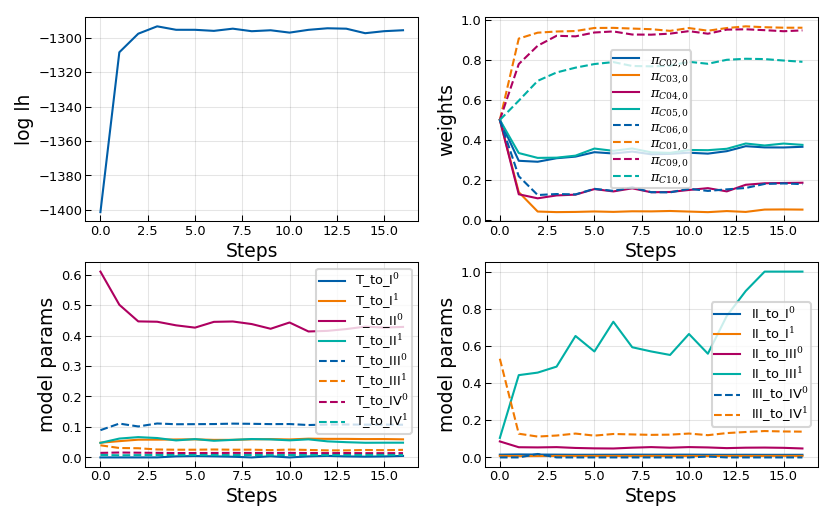

In [34]:
plot_history(history, list(icds_masks_dict.keys()))

## EM inverted and normal

In [34]:
sample_name = "oc_op_final_history_39_40_Powell"
if False:
    z_samples_oc_hp_powell, theta_samples_oc_hp_powell, history_oc_hp_powell = find_optimal_weights(m_imputations = m_imputations_fun, n_steps = 40, convergence_ths= 0.01, minimize_method='Powell', name='oc_op')
else:
    history_oc_hp_powell = np.load("./samples/expl_oc_hp/em/" + sample_name+".npy")
    z_samples_oc_hp_powell = history_oc_hp_powell

In [39]:
sample_name = "Powell_inverted_final_history_40"
if False:
    z_samples_oc_hp_inverted, theta_samples_oc_hp_inverted, history_oc_hp_inverted = find_optimal_weights_inverted(m_imputations = m_imputations_fun, n_steps = 30, convergence_ths=0.012)
else:
    history_oc_hp_inverted = np.load("./samples/expl_oc_hp/em/" + sample_name+".npy", allow_pickle=True)
    # z_samples_oc_hp_inverted


In [46]:
weights = [np.array([0.99993389, 0.99993389, 0.99993389, 0.99993389, 0.99993389,
       0.85352675, 0.78535828, 0.99993389]), np.array([0.99993389, 0.99993389, 0.99993389, 0.99805474, 0.99993389,
       0.27686348, 0.48065099, 0.73501471]), np.array([0.93171793, 0.99993389, 0.99993389, 0.9378195 , 0.99993389,
       0.1512584 , 0.3356005 , 0.55304575]), np.array([0.8514542 , 0.99998225, 1.        , 0.85687133, 0.99997845,
       0.18171053, 0.33815778, 0.50897016]), np.array([0.8275701 , 0.99993389, 0.99993389, 0.81556874, 0.99993389,
       0.13971859, 0.29507031, 0.48606261]), np.array([0.81771734, 0.99993389, 0.99434694, 0.81206317, 0.99993389,
       0.10533042, 0.26510001, 0.44440252]), np.array([0.77959507, 1.        , 0.96913891, 0.76041144, 0.94379657,
       0.10120064, 0.25658766, 0.42908021]), np.array([0.78364158, 0.99993389, 0.98348341, 0.77658819, 0.99993389,
       0.03366423, 0.15539577, 0.35517115]), np.array([0.8034093 , 0.99993389, 0.99504807, 0.79884847, 0.99993389,
       0.03608056, 0.17517557, 0.34223574]), np.array([0.80673968, 0.99993389, 0.99993389, 0.80476195, 0.99993389,
       0.02975047, 0.16553487, 0.39874155]), np.array([7.89382128e-01, 9.99933893e-01, 9.99933893e-01, 7.93460733e-01,
       9.99933893e-01, 6.61069614e-05, 8.42974889e-02, 2.48982612e-01]), np.array([7.34421138e-01, 9.99933893e-01, 9.35010410e-01, 7.41508823e-01,
       9.66468235e-01, 6.61069614e-05, 8.96092346e-02, 2.94303504e-01]), np.array([0.70066433, 0.99993389, 0.90624378, 0.70734229, 0.94109805,
       0.00532772, 0.04308372, 0.2441197 ]), np.array([6.83980743e-01, 9.99999998e-01, 8.98276171e-01, 6.76837890e-01,
       9.22680014e-01, 1.68578349e-05, 1.25878660e-02, 1.96628784e-01]), np.array([6.87249754e-01, 9.99961164e-01, 8.82591544e-01, 6.90617721e-01,
       9.25839573e-01, 1.66924125e-09, 5.43246250e-02, 1.76001197e-01]), np.array([0.72353389, 1.        , 0.91898673, 0.71143763, 0.95675031,
       0.0068515 , 0.09518699, 0.27570408]), np.array([0.69945502, 0.99993389, 0.90891677, 0.68173259, 0.92320246,
       0.01176918, 0.05878398, 0.23681537]), np.array([6.45070984e-01, 9.99933893e-01, 8.52898112e-01, 6.37167520e-01,
       8.82169772e-01, 6.61069614e-05, 1.72501514e-02, 1.57223562e-01]), np.array([6.42919060e-01, 9.99933893e-01, 8.49006593e-01, 6.38686462e-01,
       8.84969087e-01, 6.61069614e-05, 1.39016114e-02, 1.60845651e-01]), np.array([6.55715280e-01, 9.99933893e-01, 8.66713332e-01, 6.54649793e-01,
       9.05857481e-01, 6.61069614e-05, 6.61863745e-03, 1.60970039e-01])]

In [48]:
1-weights[-1]

array([3.44284720e-01, 6.61070000e-05, 1.33286668e-01, 3.45350207e-01,
       9.41425190e-02, 9.99933893e-01, 9.93381363e-01, 8.39029961e-01])

findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Lucida Calligraphy
findfont: Font family ['monospace'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'monospace' not found because none of the following families were found: Ubuntu Mono


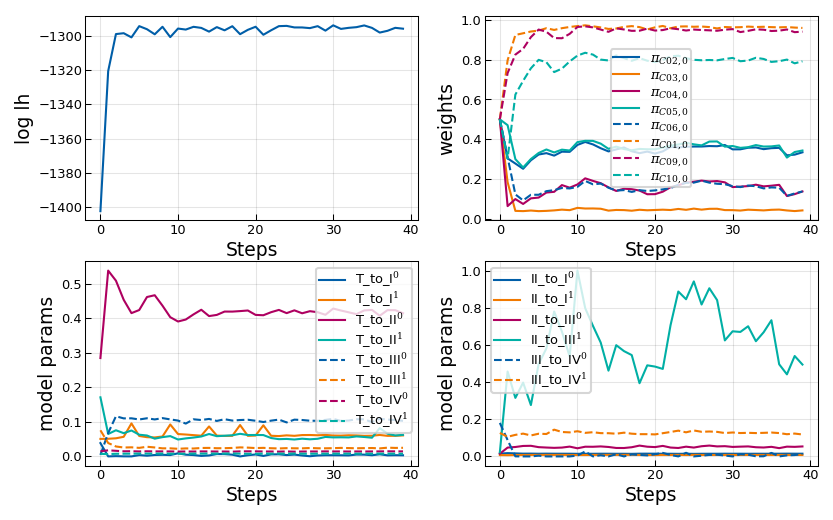

In [32]:
plot_history(history_oc_hp_powell, list(icds_masks_dict.keys()))

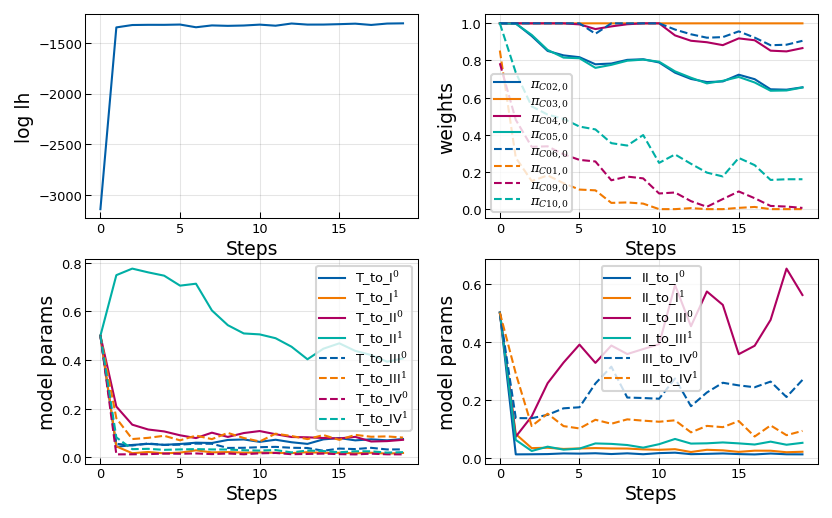

In [37]:
plot_history_inverted(history_oc_hp_inverted, list(icds_masks_dict.keys()))

In [52]:
theta_samples_oc_hp_inverted

array([6.55715280e-01, 9.99933893e-01, 8.66713332e-01, 6.54649793e-01,
       9.05857481e-01, 6.61069614e-05, 6.61863745e-03, 1.60970039e-01])

In [58]:
assignment_df = pd.DataFrame(np.stack((z_samples_oc_hp_powell.mean(axis = 0 ),1-theta_samples_oc_hp_inverted)).T, index = list(icds_masks_dict.keys()), columns = ['Sampling z', 'Sampling theta'])

In [62]:
assignment_df['subsite'] = [dataset[icds_masks_dict[icd]]["tumor"]["1"]["location"].unique()[0] for icd in list(icds_masks_dict.keys())]

In [64]:
assignment_df.T

,C02,C03,C04,C05,C06,C01,C09,C10
Sampling z,0.305884,0.051162,0.118241,0.358648,0.168528,0.964594,0.961412,0.796339
Sampling theta,0.344285,0.000066,0.133287,0.34535,0.094143,0.999934,0.993381,0.83903
subsite,oral cavity,oral cavity,oral cavity,oral cavity,oral cavity,oropharynx,oropharynx,oropharynx


In [55]:
np.stack((z_samples_oc_hp_powell.mean(axis = 0 ),theta_samples_oc_hp_inverted)).T

array([[3.05883563e-01, 6.55715280e-01],
       [5.11621391e-02, 9.99933893e-01],
       [1.18240575e-01, 8.66713332e-01],
       [3.58648107e-01, 6.54649793e-01],
       [1.68527830e-01, 9.05857481e-01],
       [9.64594149e-01, 6.61069614e-05],
       [9.61412328e-01, 6.61863745e-03],
       [7.96339102e-01, 1.60970039e-01]])

In [125]:
z_samples_oc_hp_powell = [0.305884, 0.051162, 0.118241, 0.358648, 0.168528, 0.964594, 0.961412, 0.796339]
weight_data = np.array([z_samples_oc_hp_powell, [1-x for x in z_samples_oc_hp_powell]])

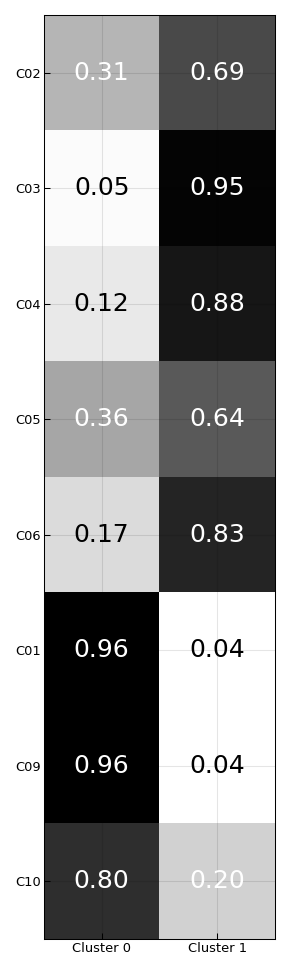

In [130]:
import numpy as np
import matplotlib.pyplot as plt

# Create a 3x2 NumPy array with values and opacities
data_w = weight_data.T

# Create a figure and axis
fig, ax = plt.subplots(figsize = (8,8))

# Define a colormap (you can customize the colormap)
cmap = plt.get_cmap('binary')
threshold=0.2
# Create a heatmap with colors determined by the array values
heatmap = ax.imshow(data_w, cmap=cmap)

# Add text labels with values in each cell
for i in range(data_w.shape[0]):
    for j in range(data_w.shape[1]):
        value = data_w[i, j]
        text_color = 'white' if value > threshold else 'black'
        ax.text(j, i, f'{data_w[i, j]:.2f}', ha='center', va='center', color=text_color, fontsize=12)

# Add color bar
# cbar = plt.colorbar(heatmap)

# Set axis labels
ax.set_xticks(np.arange(data_w.shape[1]))
ax.set_yticks(np.arange(data_w.shape[0]))
ax.set_xticklabels(['Cluster 0', 'Cluster 1'])
ax.set_yticklabels([*oc_icds, *op_icds])
# ax.set_xlabel('Row')
# ax.set_ylabel('Subsites')

# Show the plot
plt.show()


In [66]:
## For each assignment, sample the model parameters

In [49]:
global MODELS, N_CLUSTERS

n_subsites = len(all_icds)
n_clusters = 2

models_MM = create_models(n_subsites, graph_4lnl, ignore_t_stage=True, n_mixture_components=n_clusters)
for i, (k,v) in enumerate(icds_masks_dict.items()):
    models_MM[i].load_patient_data(dataset[v], mapping = lambda x: 'all')
    print(f"Loaded patients for ICD {k} (total {v.sum()} patients)")



MODELS = models_MM
N_CLUSTERS = n_clusters

Loaded patients for ICD C02 (total 158 patients)
Loaded patients for ICD C03 (total 45 patients)
Loaded patients for ICD C04 (total 99 patients)
Loaded patients for ICD C05 (total 44 patients)
Loaded patients for ICD C06 (total 46 patients)
Loaded patients for ICD C01 (total 92 patients)
Loaded patients for ICD C09 (total 258 patients)
Loaded patients for ICD C10 (total 49 patients)


In [54]:
def log_prob_n_models(theta):
    global MODELS

    for p in theta:
        if p < 0 or 1 < p:
            return -10000
    theta_grouped = [[theta[i+j] for j in range(N_CLUSTERS)] for i in range(0, len(theta), N_CLUSTERS)]
    llh = 0
    for i, model in enumerate(MODELS):
        llh += model.likelihood(given_param_args = theta_grouped, log=True)
    if np.isnan(llh):
        llh = -10000
    if np.isinf(llh):
        llh = -10000
    return llh

In [65]:
log_prob_n_models(np.random.random(14))

-3316.3471201755565

In [61]:
MODELS[6].mixture_components

[0.961412, 0.038587999999999956]

In [52]:
z_samples_oc_hp_powell = [0.305884, 0.051162, 0.118241, 0.358648, 0.168528, 0.964594, 0.961412, 0.796339]

assign_mixing_parameters(z_samples_oc_hp_powell)



In [137]:
# Sampling
sample_name = f"oc_op_final_thetas_powell_40_7_11"
sampling = False
n_params = len(MODELS[0].get_params())*N_CLUSTERS 
if sampling:
    samples_oc_op_cl2_powell,_,_= emcee_sampling_ext(log_prob_n_models, n_params, sample_name, 1000, 600, llh_args=())
else:
    samples_oc_op_cl2_powell = np.load("samples/exlp_oc_hp/"+sample_name+".npy")

FileNotFoundError: [Errno 2] No such file or directory: 'samples/exlp_oc_hp/oc_op_final_thetas_powell_40_7_11.npy'

In [68]:
params_cl1 = samples_oc_op_cl2_powell[:, ::2]
params_cl2 = samples_oc_op_cl2_powell[:, 1::2]

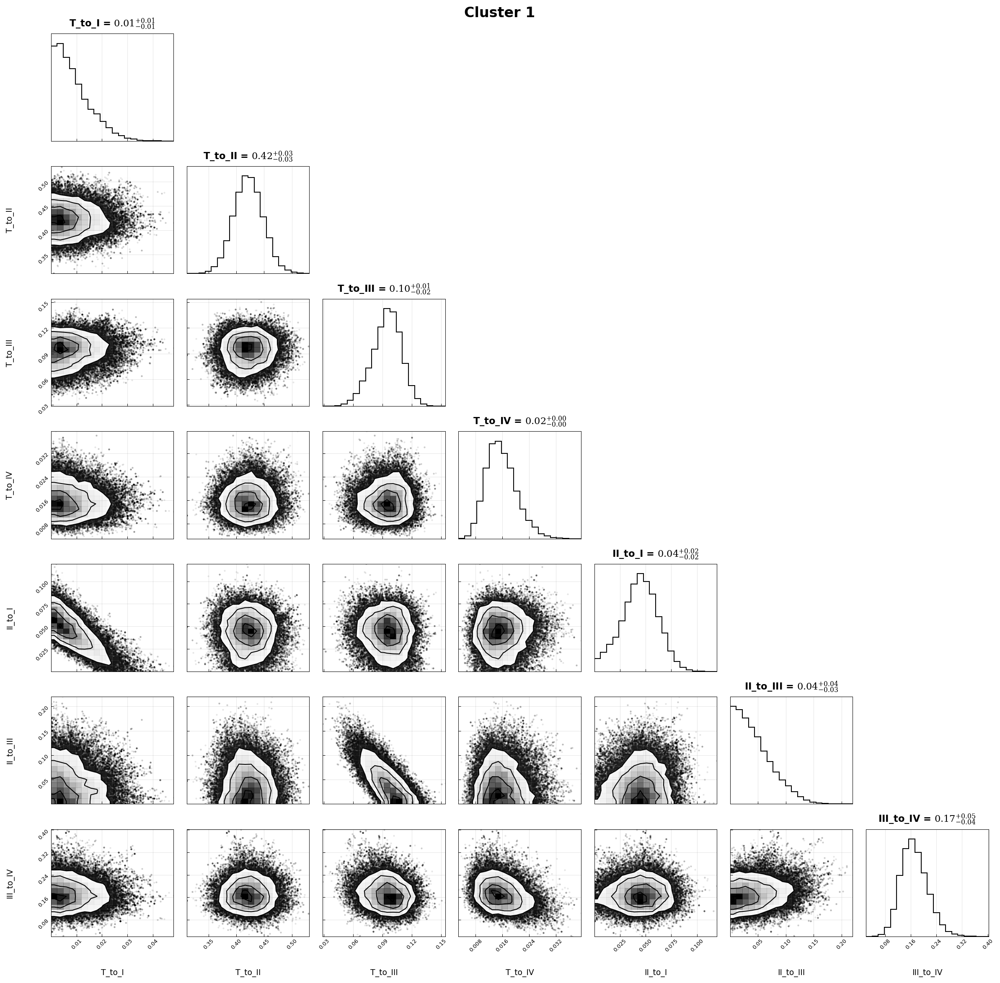

In [118]:
label_ts = [t.replace('primary', "T").replace('_spread', '') for t in MODELS[0].get_params(as_dict = True).keys()]
fig = corner.corner(
        params_cl1,
        labels=label_ts,
        show_titles=True,
    )
fig.suptitle(f'Cluster 1', fontsize=16)
fig.tight_layout()
plt.show()
# fig.savefig(PLOT_PATH / f"corner_{sample_name}.png")

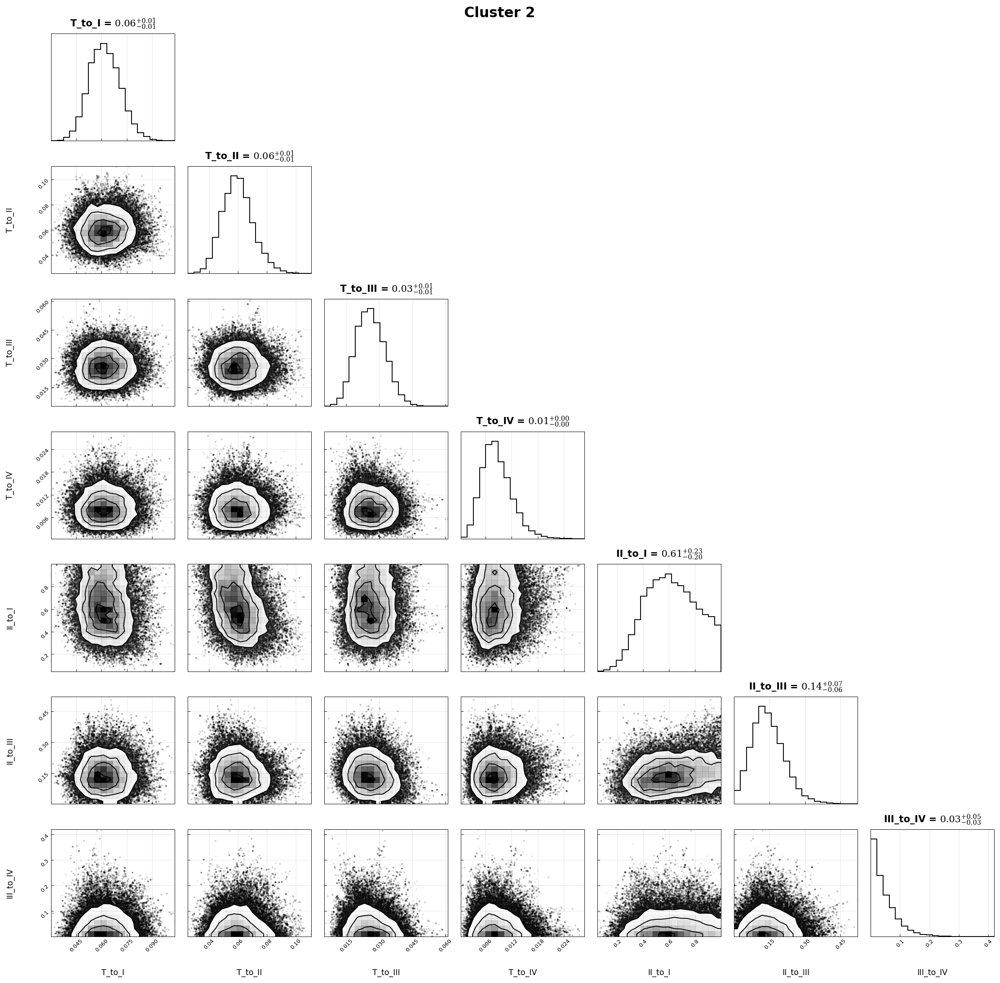

In [117]:
label_ts = [t.replace('primary', "T").replace('_spread', '') for t in MODELS[0].get_params(as_dict = True).keys()]
fig = corner.corner(
        params_cl2,
        labels=label_ts,
        show_titles=True,
    )
fig.suptitle(f'Cluster 2', fontsize=16)
fig.tight_layout()
plt.show()
# fig.savefig(PLOT_PATH / f"corner_{sample_name}.png")

findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Lucida Calligraphy
findfont: Font family ['monospace'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'monospace' not found because none of the following families were found: Ubuntu Mono


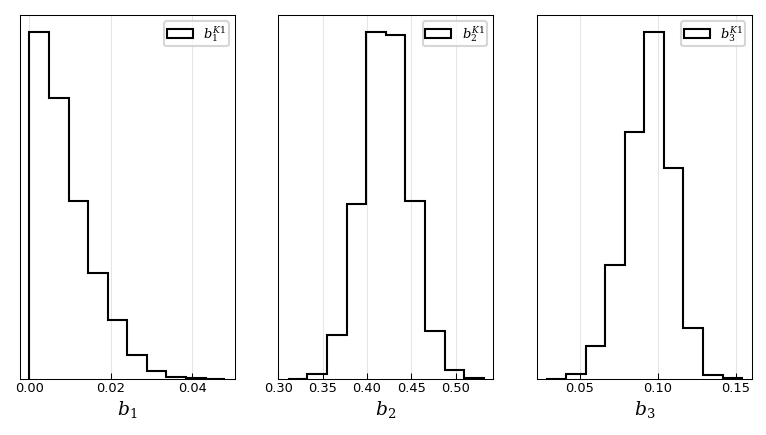

In [69]:
weights = z_samples_oc_hp_powell
kwargs = {'density': True, 'histtype': 'stepfilled'}
fix, ax = plt.subplots(1,3, figsize = set_size(width='full', ratio = 2))
# ax[0].hist(samples_s1[:,0], label = r'$b_1^{S1}$', color= usz_blue, alpha = weights[0], **kwargs)
# ax[0].hist(samples_s2[:,0], label = r'$b_1^{S2}$', color=usz_green, alpha = weights[1], **kwargs)
# ax[0].hist(samples_s3[:,0], label = r'$b_1^{S3}$', color=usz_red, alpha = weights[2], **kwargs)
ax[0].hist(params_cl1[:,0], label = r'$b_1^{K1}$', color='black', alpha = 1, density = True, histtype = "step")
ax[0].set_xlabel(r'$b_1$')
ax[0].set_yticks([])
ax[0].legend()

# ax[1].hist(samples_s1[:,1], label = r'$b_2^{S1}$', color= usz_blue, alpha = weights[0], **kwargs)
# ax[1].hist(samples_s2[:,1], label = r'$b_2^{S2}$', color=usz_green, alpha = weights[1], **kwargs)
# ax[1].hist(samples_s3[:,1], label = r'$b_2^{S3}$', color=usz_red, alpha = weights[2], **kwargs)
ax[1].hist(params_cl1[:,1], label = r'$b_2^{K1}$', color='black', alpha = 1,density = True, histtype = "step")
ax[1].set_xlabel(r'$b_2$')
ax[1].set_yticks([])
ax[1].legend()

# ax[2].hist(samples_s1[:,2], label = r'$b_3^{S1}$', color= usz_blue, alpha = weights[0], **kwargs)
# ax[2].hist(samples_s2[:,2], label = r'$b_3^{S2}$', color=usz_green, alpha = weights[1], **kwargs)
# ax[2].hist(samples_s3[:,2], label = r'$b_3^{S3}$', color=usz_red, alpha = weights[2], **kwargs)
ax[2].hist(params_cl1[:,2], label = r'$b_3^{K1}$', color='black', alpha = 1, density = True, histtype = "step")
ax[2].set_xlabel(r'$b_3$')
ax[2].set_yticks([])
ax[2].legend()
plt.show()

In [120]:
z_samples_theta_sampling = [0.344285, 0.000066, 0.133287, 0.34535, 0.094143, 0.999934, 0.993381, 0.83903]
assign_mixing_parameters(z_samples_theta_sampling)


In [166]:
z_samples_theta_sampling = [0.344285, 0.000066, 0.133287, 0.34535, 0.094143, 0.999934, 0.993381, 0.83903]
l = [np.round(x ,2) for x in z_samples_theta_sampling]
l

[0.34, 0.0, 0.13, 0.35, 0.09, 1.0, 0.99, 0.84]

In [121]:
# Sampling
sample_name = f"oc_op_final_inverted_thetas_powell_40_7_11"
sampling = True
n_params = len(MODELS[0].get_params())*N_CLUSTERS 
if sampling:
    samples_oc_op_cl2_powell_inverted,_,_= emcee_sampling_ext(log_prob_n_models, n_params, sample_name, 1000, 600, llh_args=())
else:
    samples_oc_op_cl2_powell_inverted = np.load("samples/exlp_oc_hp/"+sample_name+".npy")

Dimension: 14 with n walkers: 280
Start Burning (steps = 1000) with 8 cores


100%|██████████| 1000/1000 [09:35<00:00,  1.74it/s]


the HMM sampler for model 01 accepted 32.79 % of samples.


100%|██████████| 600/600 [05:42<00:00,  1.75it/s]

the HMM sampler for model accepted 29.91 % of samples.


In [167]:
params_cl1 = samples_oc_op_cl2_powell_inverted[:, ::2]
params_cl2 = samples_oc_op_cl2_powell_inverted[:, 1::2]

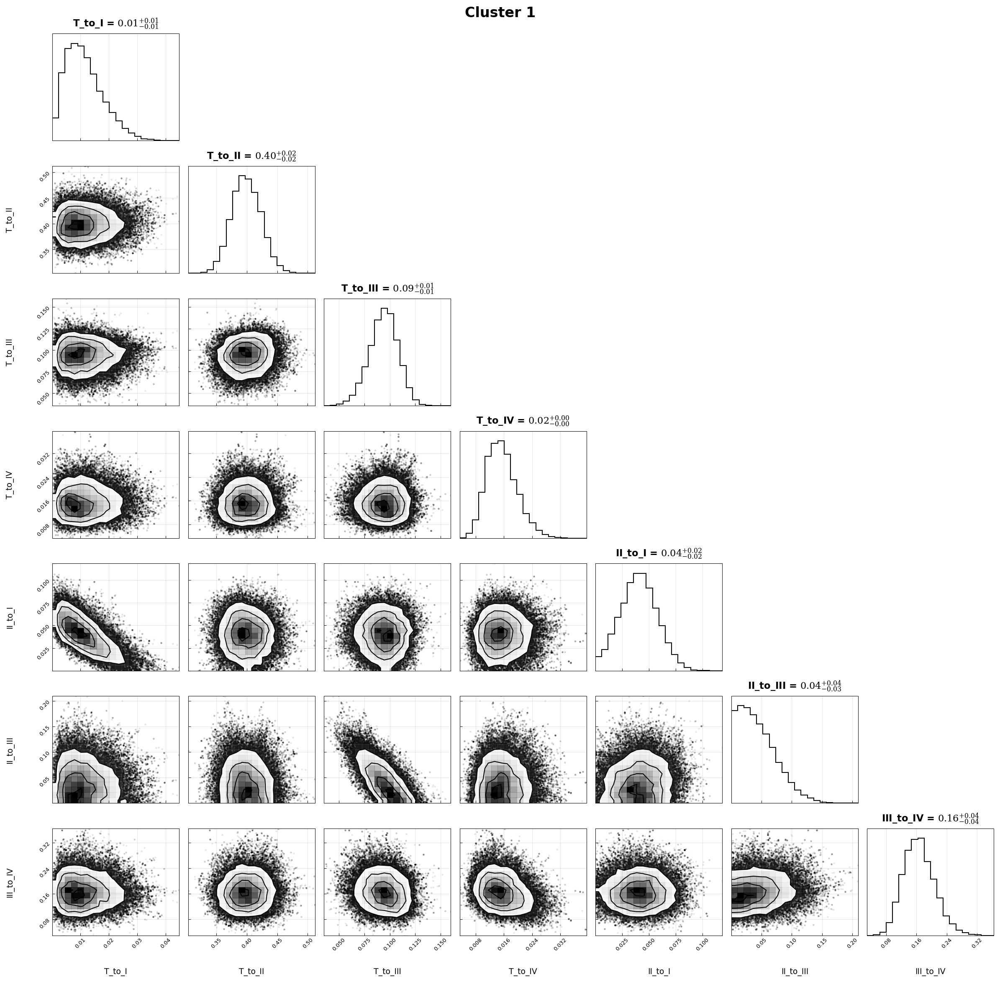

In [168]:
label_ts = [t.replace('primary', "T").replace('_spread', '') for t in MODELS[0].get_params(as_dict = True).keys()]
fig = corner.corner(
        params_cl1,
        labels=label_ts,
        show_titles=True,
    )
fig.suptitle(f'Cluster 1', fontsize=16)
fig.tight_layout()
plt.show()
# fig.savefig(PLOT_PATH / f"corner_{sample_name}.png")

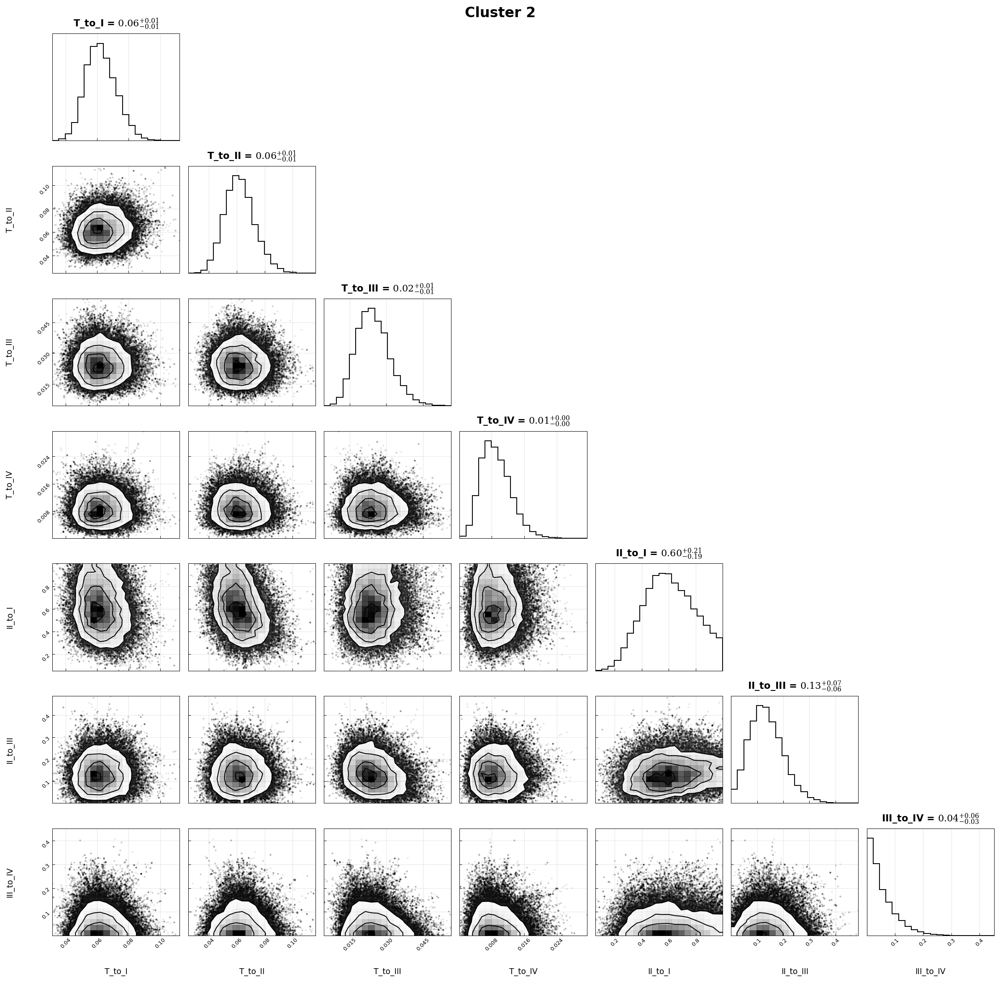

In [169]:
label_ts = [t.replace('primary', "T").replace('_spread', '') for t in MODELS[0].get_params(as_dict = True).keys()]
fig = corner.corner(
        params_cl2,
        labels=label_ts,
        show_titles=True,
    )
fig.suptitle(f'Cluster 2', fontsize=16)
fig.tight_layout()
plt.show()
# fig.savefig(PLOT_PATH / f"corner_{sample_name}.png")

## Make predictions with the posteror

In [134]:
import random
def create_obs_pred_df_single(samples, model, data, patterns, lnls, save_name=None, n_samples=100):
    
    random_idx = random.sample(range(samples.shape[0]), n_samples)
    samples_to_use = [samples[i,:] for i in random_idx]
    obs_prev = {}
    pred_prev = {}
    pred_prev_std = {}
    pred_prev_list = {}
    df_dict = {}
    t_stages = list(model.diag_time_dists)
    for t_stage in t_stages:
        obs_prev_t = {}
        pred_prev_t = {}
        pred_prev_std_t = {}
        pred_prev_list_t = {}
        df_dict_t = {}

        for pattern in patterns:
            pname = pattern
            op = compute_observed_prevalence(
                pattern={"ipsi": pattern},
                data=data,
                t_stage=t_stage,
                lnls=lnls,
            )
            # print(f"{loc}: Observed P({lnl}) = {round(op[0]/op[1], 2)} ({op})")
            pp_list = list(generate_predicted_prevalences(
                pattern={"ipsi": pattern},
                model=model,
                samples=samples_to_use,
                t_stage=t_stage,
            ))
            # predicted_prevalence overwrites the patient data, therefore we have to load it again.
            obs_prev_t[str(pname)] = op[0] / op[1] if op[1] != 0 else 0
            pred_prev_t[str(pname)] = np.mean(pp_list)
            pred_prev_std_t[str(pname)] = np.std(pp_list)
            pred_prev_list_t[str(pname)] = (pp_list, op)
            df_dict_t[str(pname)] = {
                "obs": op[0] / op[1] if op[1] != 0 else 0,
                "pred": np.mean(pp_list),
                "pred_tot":np.mean(pp_list) * op[1],
                "diff": (op[0] / op[1] if op[1] != 0 else 0) - np.mean(pp_list),
                "n/t": op,
                "n": op[0],
                "t":op[1]
            }

            # print(f"{loc}: Predicted P({lnl}) = {round(pp_list.mean(), 2)}")
        obs_prev[t_stage] = obs_prev_t
        pred_prev[t_stage] = pred_prev_t
        pred_prev_std[t_stage] = pred_prev_std_t
        pred_prev_list[t_stage] = pred_prev_list_t
        df_dict[t_stage] = df_dict_t

    df_obs_pred = pd.DataFrame((df_dict), columns=[["oral cavity"]])
    df = pd.DataFrame.from_dict(
        {
            (stage, state): df_dict[stage][state]
            for stage in df_dict.keys()
            for state in df_dict[stage].keys()
        },
        orient="columns",
    )
    df = df.stack().unstack(level=0)
    if len(t_stages) == 2:
        df['tot', "obs"] = (df["early", "n"] + df["late", "n"]) / (df["early", "t"]+df["late", "t"])
        df['tot', "pred"] = (df["early", "pred"]*df["early", "t"] + df["late", "pred"]*df["late", "t"]) / (df["early", "t"]+df["late", "t"])
        # df['tot', "n/t"] = (df["early", "n"] + df["late", "n"], df["early", "t"]+df["late", "t"])
    
    if save_name is not None:
        df.to_csv(save_name)
    return df, [obs_prev, pred_prev, pred_prev_std, pred_prev_list]


In [223]:
# create the patterns dataframe
lnls = ['I', 'II', 'III', 'IV']
states_all_raw = [
        list(combination) for combination in itertools.product([0, 1], repeat=len(lnls))
    ]
states_all = [
        {lnls[-(i + 1)]: p[i] for i in range(len(lnls))} for p in states_all_raw
    ]
states_all = [{lnls[i]: True if i==j else None for i in range(len(lnls))} for j in range(len(lnls))]

In [224]:
samples_oc.mean(axis = 0)

array([0.06003862, 0.11381327, 0.02842518, 0.01051658, 0.13627445,
       0.14475738, 0.09131636])

In [225]:
model = create_models(1, graph_4lnl, ignore_t_stage=True, n_mixture_components=1)
# model.mixture_components = [final_weights[0],  1-final_weights[0]]
d = dataset[oc_mask]
params = samples_oc

oc_df, oc_list = create_obs_pred_df_single(params, model, d, states_all, lnls, 'prevalences/MM_oc_op_oc_prev_df_risklnl.csv',n_samples = 500)



In [226]:
oc_df

all                   \
                                                      diff    n         n/t   
{'I': None, 'II': None, 'III': None, 'IV': True} -0.004917   15   (15, 394)   
{'I': None, 'II': None, 'III': True, 'IV': None} -0.004105   49   (49, 394)   
{'I': None, 'II': True, 'III': None, 'IV': None}  0.000208  115  (115, 394)   
{'I': True, 'II': None, 'III': None, 'IV': None} -0.003842   79   (79, 394)   

                                                                      \
                                                       obs      pred   
{'I': None, 'II': None, 'III': None, 'IV': True}  0.038071  0.042988   
{'I': None, 'II': None, 'III': True, 'IV': None}  0.124365   0.12847   
{'I': None, 'II': True, 'III': None, 'IV': None}  0.291878   0.29167   
{'I': True, 'II': None, 'III': None, 'IV': None}  0.200508   0.20435   

                                                                   
                                                    pred_tot    t  
{'I': None, 'II': None, 'III': None, 'IV': True}   16.937243  394  
{'I': None, 'II': None, 'III': True, 'IV': None}   50.617283  394  
{'I': None, 'II': True, 'III': None, 'IV': None}  114.917875  394  
{'I': True, 'II': None, 'III': None, 'IV': None}   80.513746  394

In [227]:
weights = z_samples_oc_hp_powell
oc_MM_dfs = []
oc_MM_lists = []
for i, icd in enumerate(oc_icds):
    print(f"Prevalence {icd}")
    model_mm_c1 = create_models(1, graph_4lnl, ignore_t_stage=True, n_mixture_components=2)
    model_mm_c1.mixture_components = [weights[0],  1-weights[0]]
    d = dataset[icds_masks_dict[icd]]
    params = samples_oc_op_cl2_powell

    oc_MM_df,  oc_MM_list = create_obs_pred_df_single(params, model_mm_c1, d, states_all, lnls, f"prevalences/MM_oc_op_{icd}_prev_df.csv", n_samples = 500)
    oc_MM_dfs.append(oc_MM_df)
    oc_MM_lists.append(oc_MM_list)

Prevalence C02
Prevalence C03
Prevalence C04
Prevalence C05
Prevalence C06


In [265]:
data_oc = [oc_df['all']['obs'],oc_df['all']['pred'], oc_df['all']['obs']- oc_df['all']['pred'], oc_df['all']['obs']- oc_df['all']['pred']]
data = [[d['all']['obs'],d['all']['pred'], d['all']['pred']- d['all']['obs'], oc_df['all']['pred'] - d['all']['obs'] ] for d in oc_MM_dfs]

In [264]:
columns = pd.MultiIndex.from_product([
    ('Oral Cavity', 'Obs'), ('Oral Cavity', 'Pred'), ('B', 'First'), ('B', 'Second'), ('C', 'First')
])
columns = pd.MultiIndex.from_product([])
pd.concat([pd.DataFrame(d) for d in data ], axis = 0)
pd.concat([pd.DataFrame([*data_oc]), pd.concat([pd.DataFrame(d) for d in data ], axis = 0)]).T

,obs,pred,Unnamed 0,obs,pred,Unnamed 0,Unnamed 1,obs,pred,Unnamed 0,...,Unnamed 0,Unnamed 1,obs,pred,Unnamed 0,Unnamed 1,obs,pred,Unnamed 0,Unnamed 1
"{'I': None, 'II': None, 'III': None, 'IV': True}",0.038071,0.042988,-0.004917,0.063291,0.052112,-0.011180,-0.020303,0.000000,0.052199,0.052199,...,0.051917,0.042988,0.090909,0.051819,-0.039090,-0.047921,0.021739,0.052593,0.030854,0.021249
"{'I': None, 'II': None, 'III': True, 'IV': None}",0.124365,0.128470,-0.004105,0.164557,0.156921,-0.007636,-0.036087,0.000000,0.158354,0.158354,...,0.015724,-0.012944,0.113636,0.156398,0.042762,0.014834,0.065217,0.157716,0.092498,0.063253
"{'I': None, 'II': True, 'III': None, 'IV': None}",0.291878,0.291670,0.000208,0.341772,0.341428,-0.000344,-0.050102,0.200000,0.342922,0.142922,...,0.108553,0.059347,0.363636,0.342187,-0.021449,-0.071967,0.260870,0.340669,0.079800,0.030800
"{'I': True, 'II': None, 'III': None, 'IV': None}",0.200508,0.204350,-0.003842,0.132911,0.188662,0.055750,0.071438,0.377778,0.188727,-0.189051,...,-0.032834,-0.017873,0.159091,0.188296,0.029205,0.045259,0.239130,0.188785,-0.050345,-0.034781


In [239]:
d['all']['obs']

KeyError: 'all'

In [237]:
data

[[{'I': None, 'II': None, 'III': None, 'IV': True}    0.063291
  {'I': None, 'II': None, 'III': True, 'IV': None}    0.164557
  {'I': None, 'II': True, 'III': None, 'IV': None}    0.341772
  {'I': True, 'II': None, 'III': None, 'IV': None}    0.132911
  Name: obs, dtype: object,
  {'I': None, 'II': None, 'III': None, 'IV': True}    0.052112
  {'I': None, 'II': None, 'III': True, 'IV': None}    0.156921
  {'I': None, 'II': True, 'III': None, 'IV': None}    0.341428
  {'I': True, 'II': None, 'III': None, 'IV': None}    0.188662
  Name: pred, dtype: object,
  {'I': None, 'II': None, 'III': None, 'IV': True}    -0.01118
  {'I': None, 'II': None, 'III': True, 'IV': None}   -0.007636
  {'I': None, 'II': True, 'III': None, 'IV': None}   -0.000344
  {'I': True, 'II': None, 'III': None, 'IV': None}     0.05575
  dtype: object,
  {'I': None, 'II': None, 'III': None, 'IV': True}   -0.020303
  {'I': None, 'II': None, 'III': True, 'IV': None}   -0.036087
  {'I': None, 'II': True, 'III': None, 'IV':

In [248]:
columns = pd.MultiIndex.from_tuples([
    ('Oral Cavity', 'Obs'), ('Oral Cavity', 'Pred'), ('B', 'First'), ('B', 'Second'), ('C', 'First')
])
(pd.DataFrame([oc_df['all']['obs'],oc_df['all']['pred'], oc_df['all']['obs']- oc_df['all']['pred']])*100).round

TypeError: Field elements must be 2- or 3-tuples, got '{'I': None, 'II': None, 'III': None, 'IV': True}    0.090909
{'I': None, 'II': None, 'III': True, 'IV': None}    0.113636
{'I': None, 'II': True, 'III': None, 'IV': None}    0.363636
{'I': True, 'II': None, 'III': None, 'IV': None}    0.159091
Name: obs, dtype: object'

In [159]:
oc_MM_dfs[2]

all                \
                                                        diff   n       n/t   
{'IV': False, 'III': False, 'II': False, 'I': F...  0.051418  55  (55, 99)   
{'IV': False, 'III': False, 'II': False, 'I': T...  0.056099  14  (14, 99)   
{'IV': False, 'III': False, 'II': True, 'I': Fa... -0.039382  13  (13, 99)   
{'IV': False, 'III': False, 'II': True, 'I': True} -0.027727   3   (3, 99)   
{'IV': False, 'III': True, 'II': False, 'I': Fa...  0.019215   6   (6, 99)   
{'IV': False, 'III': True, 'II': False, 'I': True}   0.00235   1   (1, 99)   
{'IV': False, 'III': True, 'II': True, 'I': False} -0.023556   3   (3, 99)   
{'IV': False, 'III': True, 'II': True, 'I': True}    0.01333   4   (4, 99)   
{'IV': True, 'III': False, 'II': False, 'I': Fa... -0.012103   0   (0, 99)   
{'IV': True, 'III': False, 'II': False, 'I': True} -0.002607   0   (0, 99)   
{'IV': True, 'III': False, 'II': True, 'I': False} -0.007431   0   (0, 99)   
{'IV': True, 'III': False, 'II': True, 'I': True}  -0.002305   0   (0, 99)   
{'IV': True, 'III': True, 'II': False, 'I': False}  -0.00505   0   (0, 99)   
{'IV': True, 'III': True, 'II': False, 'I': True}  -0.000893   0   (0, 99)   
{'IV': True, 'III': True, 'II': True, 'I': False}  -0.016677   0   (0, 99)   
{'IV': True, 'III': True, 'II': True, 'I': True}   -0.004681   0   (0, 99)   

                                                                        \
                                                         obs      pred   
{'IV': False, 'III': False, 'II': False, 'I': F...  0.555556  0.504137   
{'IV': False, 'III': False, 'II': False, 'I': T...  0.141414  0.085316   
{'IV': False, 'III': False, 'II': True, 'I': Fa...  0.131313  0.170695   
{'IV': False, 'III': False, 'II': True, 'I': True}  0.030303   0.05803   
{'IV': False, 'III': True, 'II': False, 'I': Fa...  0.060606  0.041391   
{'IV': False, 'III': True, 'II': False, 'I': True}  0.010101  0.007751   
{'IV': False, 'III': True, 'II': True, 'I': False}  0.030303  0.053859   
{'IV': False, 'III': True, 'II': True, 'I': True}   0.040404  0.027074   
{'IV': True, 'III': False, 'II': False, 'I': Fa...       0.0  0.012103   
{'IV': True, 'III': False, 'II': False, 'I': True}       0.0  0.002607   
{'IV': True, 'III': False, 'II': True, 'I': False}       0.0  0.007431   
{'IV': True, 'III': False, 'II': True, 'I': True}        0.0  0.002305   
{'IV': True, 'III': True, 'II': False, 'I': False}       0.0   0.00505   
{'IV': True, 'III': True, 'II': False, 'I': True}        0.0  0.000893   
{'IV': True, 'III': True, 'II': True, 'I': False}        0.0  0.016677   
{'IV': True, 'III': True, 'II': True, 'I': True}         0.0  0.004681   

                                                                   
                                                     pred_tot   t  
{'IV': False, 'III': False, 'II': False, 'I': F...  49.909585  99  
{'IV': False, 'III': False, 'II': False, 'I': T...   8.446235  99  
{'IV': False, 'III': False, 'II': True, 'I': Fa...  16.898844  99  
{'IV': False, 'III': False, 'II': True, 'I': True}    5.74493  99  
{'IV': False, 'III': True, 'II': False, 'I': Fa...   4.097698  99  
{'IV': False, 'III': True, 'II': False, 'I': True}   0.767343  99  
{'IV': False, 'III': True, 'II': True, 'I': False}   5.332083  99  
{'IV': False, 'III': True, 'II': True, 'I': True}     2.68036  99  
{'IV': True, 'III': False, 'II': False, 'I': Fa...   1.198178  99  
{'IV': True, 'III': False, 'II': False, 'I': True}   0.258107  99  
{'IV': True, 'III': False, 'II': True, 'I': False}    0.73566  99  
{'IV': True, 'III': False, 'II': True, 'I': True}    0.228185  99  
{'IV': True, 'III': True, 'II': False, 'I': False}   0.499966  99  
{'IV': True, 'III': True, 'II': False, 'I': True}    0.088431  99  
{'IV': True, 'III': True, 'II': True, 'I': False}    1.650987  99  
{'IV': True, 'III': True, 'II': True, 'I': True}     0.463408  99

In [141]:
z_samples_oc_hp_powell

[0.305884,
 0.051162,
 0.118241,
 0.358648,
 0.168528,
 0.964594,
 0.961412,
 0.796339]

In [60]:
final_thetas = [
    6.23352343e-02, 6.21400220e-04, 8.01803284e-02, 4.14934329e-01,
    2.52912375e-02, 1.01903686e-01, 8.08884587e-03, 1.46254411e-02,
    5.02898111e-01, 5.43009073e-02, 1.21180072e-01, 1.59736837e-02,
    6.61053686e-05, 1.67344242e-01
]
m_imputations_fun = lambda x: int(5/(20)*x + 5)
z_samples, theta_samples, history = find_optimal_weights(m_imputations = m_imputations_fun, n_steps = 20, convergence_ths= 0.008, minimize_method='Powell', theta_initial=final_thetas)

Step 0 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 5 imputations.. 
Dimension: 8 with n walkers: 160


Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [01:13<00:00,  4.09it/s]


the HMM sampler for model 01 accepted 40.35 % of samples.


100%|██████████| 100/100 [00:28<00:00,  3.45it/s]


the HMM sampler for model accepted 38.54 % of samples.
    Pi's: [[0.75630657 0.99856396 0.86084753 0.70654949 0.9623439  0.09554943
  0.07617553 0.20342351]
 [0.61173182 0.93436168 0.7701694  0.65702608 0.8410399  0.09668469
  0.0499116  0.23013599]
 [0.69100263 0.88943076 0.92004595 0.56872108 0.99636846 0.01778792
  0.01529632 0.20484752]
 [0.65875723 0.99148564 0.86353994 0.78298196 0.73127313 0.11340289
  0.12060714 0.23074572]
 [0.66793636 0.79088991 0.83956757 0.69176691 0.98683334 0.05164736
  0.0429566  0.29133806]]
Performing maximization: 
    theta_i: [6.04427712e-02 5.23077772e-08 6.23064192e-02 4.26754509e-01
 2.79461036e-02 8.39317091e-02 8.04487909e-03 1.46914513e-02
 5.16192652e-01 5.69492435e-02 1.15119765e-01 5.54962645e-02
 6.61069614e-05 1.77497847e-01]
Step 1 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 5 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [01:06<00:00,  4.50it/s]


the HMM sampler for model 01 accepted 39.42 % of samples.


100%|██████████| 100/100 [00:21<00:00,  4.69it/s]


the HMM sampler for model accepted 39.33 % of samples.
    Pi's: [[0.67024355 0.97069168 0.84590042 0.67953318 0.90569431 0.02697144
  0.10005605 0.44848031]
 [0.69801755 0.97565948 0.724367   0.88444423 0.86880559 0.01065175
  0.03236209 0.36854087]
 [0.62881313 0.99849421 0.82453527 0.83784127 0.89732258 0.07678041
  0.07102459 0.12133562]
 [0.61130705 0.88157808 0.91266826 0.66495327 0.80632834 0.02039833
  0.07043505 0.36202804]
 [0.60800526 0.97905874 0.87093702 0.71661963 0.94579328 0.02012991
  0.07232561 0.19442107]]
Performing maximization: 
    theta_i: [5.82718384e-02 5.18389847e-03 5.96865021e-02 4.32953640e-01
 2.50443912e-02 1.09776705e-01 8.17721834e-03 1.44039247e-02
 6.04049578e-01 4.61807393e-02 1.22530888e-01 6.61069614e-05
 6.61069614e-05 1.62117579e-01]
Step 2 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 5 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [01:06<00:00,  4.53it/s]


the HMM sampler for model 01 accepted 38.40 % of samples.


100%|██████████| 100/100 [00:25<00:00,  3.87it/s]


the HMM sampler for model accepted 37.61 % of samples.
    Pi's: [[0.62740098 0.9943792  0.82251552 0.80073053 0.67128849 0.12723872
  0.08384879 0.17218417]
 [0.75735823 0.99108948 0.8592302  0.62727013 0.69152901 0.01481822
  0.04532145 0.05331878]
 [0.68061591 0.99717256 0.76682521 0.83016457 0.81473396 0.11129453
  0.02801695 0.13668699]
 [0.68958154 0.98913848 0.81032945 0.69655662 0.90488317 0.03253776
  0.05208535 0.26147823]
 [0.63467886 0.90883533 0.9336855  0.61686976 0.85992574 0.00165787
  0.10220492 0.13410878]]
Performing maximization: 
    theta_i: [7.51162464e-02 1.70516533e-03 6.02036319e-02 4.21201268e-01
 2.40655594e-02 1.09413660e-01 8.16690384e-03 1.42146384e-02
 5.38810234e-01 5.48001847e-02 1.24237820e-01 3.41522932e-11
 6.61069611e-05 1.60692873e-01]
Step 3 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 5 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [01:07<00:00,  4.46it/s]


the HMM sampler for model 01 accepted 38.67 % of samples.


100%|██████████| 100/100 [00:23<00:00,  4.25it/s]


the HMM sampler for model accepted 38.12 % of samples.
    Pi's: [[0.56834166 0.94286267 0.88354528 0.76762664 0.99812342 0.01777491
  0.05026829 0.39905214]
 [0.66220226 0.97300014 0.93343349 0.74300883 0.7676155  0.02947048
  0.04043664 0.23428369]
 [0.64164464 0.9765767  0.73395229 0.63512472 0.88225299 0.03247309
  0.03207185 0.24482694]
 [0.63586823 0.95882468 0.87251273 0.54457002 0.68282821 0.03413741
  0.06429376 0.25665177]
 [0.63594685 0.97600134 0.85752241 0.72541795 0.88297551 0.09332768
  0.03768647 0.09855979]]
Performing maximization: 
    theta_i: [6.05053353e-02 3.28470510e-03 5.81150692e-02 4.20316206e-01
 2.47394061e-02 1.08248206e-01 8.03020336e-03 1.43429463e-02
 6.06015824e-01 5.21078222e-02 1.23642380e-01 6.61069614e-05
 6.61069614e-05 1.60533356e-01]
Step 4 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 6 imputations.. 
Dimension: 8 with n walkers: 160
Start Burning (steps = 300) with 8 cores


100%|██████████| 300/300 [01:07<00:00,  4.44it/s]


the HMM sampler for model 01 accepted 38.23 % of samples.


100%|██████████| 100/100 [00:19<00:00,  5.04it/s]


the HMM sampler for model accepted 38.98 % of samples.
    Pi's: [[0.65202681 0.97882781 0.77602172 0.83400078 0.96794867 0.01287022
  0.08920323 0.26201338]
 [0.60710852 0.89023051 0.84863055 0.66059937 0.91613526 0.02306955
  0.06912509 0.32062654]
 [0.55680423 0.96637999 0.77172545 0.80087796 0.86659906 0.07282321
  0.00677493 0.05831169]
 [0.64965755 0.89509498 0.88741532 0.49352127 0.94989731 0.08522794
  0.00911621 0.14516997]
 [0.66974607 0.98702825 0.94023803 0.66765643 0.94877624 0.10015266
  0.00205235 0.10458047]
 [0.69502592 0.89203525 0.85698727 0.47637585 0.85590682 0.00917136
  0.03153448 0.11168366]]
Performing maximization: 
    theta_i: [5.89631127e-02 9.49690135e-03 5.57952493e-02 4.12370758e-01
 2.32759992e-02 1.08174639e-01 8.17355349e-03 1.42645613e-02
 6.08284590e-01 4.12064741e-02 1.25652384e-01 6.71045822e-07
 6.61069477e-05 1.56923259e-01]
Step 5 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 6 imputations.. 
Dimension: 8 with n walkers: 

100%|██████████| 300/300 [01:05<00:00,  4.56it/s]


the HMM sampler for model 01 accepted 37.14 % of samples.


100%|██████████| 100/100 [00:22<00:00,  4.36it/s]


the HMM sampler for model accepted 37.39 % of samples.
    Pi's: [[0.73848813 0.95123781 0.89372413 0.71907534 0.8758905  0.02382703
  0.06872049 0.30309974]
 [0.70251141 0.9882938  0.83329942 0.59462523 0.95960001 0.02178218
  0.06517186 0.02459124]
 [0.59871117 0.98880203 0.81202431 0.6238811  0.73238936 0.09501791
  0.08843388 0.22760519]
 [0.67075534 0.9326952  0.86201038 0.67509796 0.72768132 0.03035202
  0.01187216 0.28045675]
 [0.59817369 0.95947684 0.77332774 0.59426678 0.6777363  0.01143856
  0.02382825 0.05769307]
 [0.74018655 0.95949332 0.8554861  0.63190196 0.9107597  0.00567096
  0.07882561 0.2327567 ]]
Performing maximization: 
    theta_i: [5.96453686e-02 4.62350152e-03 5.55905275e-02 4.23188800e-01
 2.38844254e-02 1.08703334e-01 8.14532384e-03 1.41954868e-02
 6.67861636e-01 4.94815522e-02 1.28151906e-01 6.61069614e-05
 6.61069614e-05 1.59898726e-01]
Step 6 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 6 imputations.. 
Dimension: 8 with n walkers: 

100%|██████████| 300/300 [01:03<00:00,  4.69it/s]


the HMM sampler for model 01 accepted 37.69 % of samples.


100%|██████████| 100/100 [00:19<00:00,  5.08it/s]


the HMM sampler for model accepted 37.48 % of samples.
    Pi's: [[0.58593187 0.99404339 0.93427943 0.5613473  0.81488691 0.03458954
  0.04924898 0.18427619]
 [0.64348093 0.94590254 0.89293146 0.6501814  0.78269875 0.05298952
  0.04251752 0.19514567]
 [0.66800856 0.98067357 0.85785962 0.74124631 0.95012685 0.10507196
  0.10044871 0.10111647]
 [0.72752142 0.97164057 0.76385767 0.84494954 0.8497892  0.0163138
  0.12746678 0.31119688]
 [0.67629645 0.98419512 0.74070049 0.50219275 0.98530488 0.02374374
  0.04584934 0.39217116]
 [0.66677553 0.9542844  0.78332291 0.65784986 0.75182469 0.05800332
  0.07536319 0.26055806]]
Performing maximization: 
    theta_i: [5.90768512e-02 2.31207890e-03 5.72564799e-02 4.33668926e-01
 2.50420814e-02 1.09463584e-01 8.05026633e-03 1.44632864e-02
 6.25265812e-01 5.23215360e-02 1.24294071e-01 6.61069614e-05
 6.61069614e-05 1.62558753e-01]
Step 7 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 6 imputations.. 
Dimension: 8 with n walkers: 1

100%|██████████| 300/300 [01:01<00:00,  4.87it/s]


the HMM sampler for model 01 accepted 38.69 % of samples.


100%|██████████| 100/100 [00:20<00:00,  4.87it/s]


the HMM sampler for model accepted 39.44 % of samples.
    Pi's: [[0.70031409 0.97294467 0.87997074 0.48355708 0.89092564 0.03646273
  0.0433453  0.16400231]
 [0.73791577 0.99695812 0.77902546 0.5536428  0.90534188 0.03734305
  0.04955945 0.04295583]
 [0.69494779 0.91731708 0.8437159  0.75605759 0.80128044 0.01746864
  0.03244074 0.1355451 ]
 [0.71576683 0.99934345 0.83898202 0.79668863 0.86052193 0.02777651
  0.01602077 0.17071706]
 [0.75172089 0.97900341 0.77578734 0.92216571 0.84939506 0.0588778
  0.09249241 0.40739799]
 [0.58644607 0.96483353 0.81391948 0.58495141 0.90507071 0.01073683
  0.04471265 0.06178449]]
Performing maximization: 
    theta_i: [6.08794369e-02 4.35774107e-03 6.26890071e-02 4.15439827e-01
 2.40205588e-02 1.02955007e-01 8.09591479e-03 1.43638600e-02
 5.33496446e-01 5.04557404e-02 1.18079367e-01 1.35575596e-02
 6.61069614e-05 1.61544322e-01]
Step 8 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 7 imputations.. 
Dimension: 8 with n walkers: 1

100%|██████████| 300/300 [01:01<00:00,  4.89it/s]


the HMM sampler for model 01 accepted 37.62 % of samples.


100%|██████████| 100/100 [00:18<00:00,  5.29it/s]


the HMM sampler for model accepted 36.96 % of samples.
    Pi's: [[0.67383685 0.9635509  0.85993495 0.57358211 0.96147566 0.00514897
  0.01031222 0.0645982 ]
 [0.72166304 0.99111966 0.85121588 0.71709845 0.90394224 0.00207591
  0.05110006 0.14125538]
 [0.58419202 0.97765368 0.90830648 0.77267297 0.81413968 0.01659163
  0.02766224 0.17047508]
 [0.54922892 0.99520633 0.87444151 0.82369671 0.8621779  0.06091296
  0.0622716  0.3211265 ]
 [0.65036211 0.95901123 0.89434816 0.66160665 0.81739416 0.00384609
  0.00971239 0.20048532]
 [0.69946066 0.97647905 0.77921511 0.78208135 0.95913942 0.04340122
  0.05842207 0.11191991]
 [0.71262175 0.98914225 0.88599402 0.9086586  0.8565827  0.02239867
  0.04153221 0.25814738]]
Performing maximization: 
    theta_i: [6.06215442e-02 5.06276326e-03 6.28796524e-02 4.13539136e-01
 2.34769251e-02 1.09471759e-01 8.16340047e-03 1.43015090e-02
 5.07615683e-01 4.95120594e-02 1.18294219e-01 6.61069614e-05
 6.61069614e-05 1.58242961e-01]
Step 9 - - - - - - - - - - - 

100%|██████████| 300/300 [01:00<00:00,  4.93it/s]


the HMM sampler for model 01 accepted 36.81 % of samples.


100%|██████████| 100/100 [00:20<00:00,  4.99it/s]


the HMM sampler for model accepted 35.99 % of samples.
    Pi's: [[6.88577639e-01 9.14824997e-01 8.56479080e-01 6.31683925e-01
  9.57285437e-01 6.03009342e-04 6.83613669e-02 1.60335980e-01]
 [7.52898883e-01 9.21765014e-01 9.35607640e-01 6.88528171e-01
  9.55507018e-01 4.62970645e-02 7.95282099e-03 8.95873868e-02]
 [6.22347397e-01 9.83073053e-01 8.26379424e-01 7.16594141e-01
  8.60289449e-01 2.46528827e-02 4.45314019e-02 2.32597404e-01]
 [6.78323558e-01 9.14550150e-01 9.02304125e-01 7.99305963e-01
  9.42118955e-01 5.13811242e-02 6.48708563e-02 2.24976679e-01]
 [7.10585242e-01 9.59436497e-01 8.15576037e-01 7.48862261e-01
  9.45461872e-01 1.99744294e-02 1.65838008e-02 8.13653051e-02]
 [6.89370565e-01 9.89407989e-01 9.02587258e-01 8.49939716e-01
  8.14940150e-01 2.01060361e-02 1.02525484e-03 2.23761217e-01]
 [6.97808199e-01 9.55840295e-01 9.10373741e-01 8.68502188e-01
  8.70456173e-01 8.49094772e-03 7.01661349e-02 3.63143740e-01]]
Performing maximization: 
    theta_i: [5.98791560e-02 5.66

100%|██████████| 300/300 [01:00<00:00,  4.93it/s]


the HMM sampler for model 01 accepted 36.40 % of samples.


100%|██████████| 100/100 [00:24<00:00,  4.07it/s]


the HMM sampler for model accepted 36.08 % of samples.
    Pi's: [[0.66574958 0.99021655 0.95911508 0.66979562 0.78809435 0.018605
  0.0659472  0.27524411]
 [0.67471566 0.97197542 0.85740062 0.52476271 0.8418811  0.00662236
  0.06382354 0.26769071]
 [0.74618271 0.93258684 0.85386987 0.52110045 0.96087367 0.00880441
  0.04536468 0.27966317]
 [0.70554372 0.98748364 0.9495383  0.5207382  0.98988937 0.01432181
  0.0869758  0.29890074]
 [0.69407504 0.97847973 0.89683003 0.57941201 0.72360039 0.01452619
  0.00936813 0.1098302 ]
 [0.62288258 0.90832715 0.9047792  0.51558732 0.90108177 0.01168325
  0.02377418 0.06872856]
 [0.76491241 0.99939559 0.892257   0.68833529 0.83359769 0.09180539
  0.05600206 0.25492476]]
Performing maximization: 
    theta_i: [5.93351509e-02 5.40782363e-03 6.34607921e-02 4.20275181e-01
 2.44393108e-02 1.09242169e-01 7.89329718e-03 1.47000579e-02
 4.75331602e-01 4.87830223e-02 1.21129049e-01 6.61069614e-05
 6.61069614e-05 1.61427577e-01]
Step 11 - - - - - - - - - - - -

100%|██████████| 300/300 [00:59<00:00,  5.05it/s]


the HMM sampler for model 01 accepted 36.86 % of samples.


100%|██████████| 100/100 [00:18<00:00,  5.34it/s]


the HMM sampler for model accepted 36.41 % of samples.
    Pi's: [[0.58910693 0.98920922 0.94504458 0.81835606 0.77485144 0.08177851
  0.0313159  0.16785775]
 [0.75120147 0.99843667 0.87120513 0.67856064 0.86318243 0.00508559
  0.08082703 0.24654684]
 [0.64818161 0.99898701 0.82708799 0.68566784 0.86667031 0.02343676
  0.08896664 0.39116644]
 [0.68034773 0.99816047 0.83298195 0.76260488 0.85957848 0.02789449
  0.09256017 0.18166918]
 [0.66386062 0.98448558 0.79550161 0.61330824 0.97662221 0.0260804
  0.07629737 0.20756353]
 [0.57834714 0.99277481 0.79669483 0.53543021 0.71939183 0.13768414
  0.16031893 0.26294032]
 [0.68971482 0.94015581 0.91140276 0.69383589 0.87120896 0.03854021
  0.00552496 0.24611716]]
Performing maximization: 
    theta_i: [5.77090272e-02 4.51733578e-03 5.81359724e-02 4.35263660e-01
 2.52179561e-02 1.09566061e-01 8.23395248e-03 1.43313736e-02
 6.13438230e-01 4.76393651e-02 1.23717752e-01 6.61069614e-05
 6.61069614e-05 1.63787165e-01]
Step 12 - - - - - - - - - - - 

100%|██████████| 300/300 [00:57<00:00,  5.20it/s]


the HMM sampler for model 01 accepted 38.29 % of samples.


100%|██████████| 100/100 [00:19<00:00,  5.15it/s]


the HMM sampler for model accepted 38.59 % of samples.
    Pi's: [[0.64052134 0.961848   0.89288304 0.70828228 0.97175806 0.03205338
  0.11577935 0.28472251]
 [0.65568328 0.97889966 0.80904156 0.66621975 0.94764297 0.03164785
  0.05120914 0.0381416 ]
 [0.7497838  0.854002   0.89173945 0.65933949 0.78906293 0.08289559
  0.06066746 0.1544658 ]
 [0.64319914 0.99282373 0.64966114 0.72723858 0.91563351 0.00276147
  0.03788442 0.27982994]
 [0.60153382 0.95828619 0.8784553  0.828265   0.89000603 0.05636613
  0.09549052 0.23293314]
 [0.63558781 0.99972317 0.90489216 0.65337722 0.92264055 0.03557589
  0.12700235 0.33379616]
 [0.65513949 0.993164   0.75033556 0.86565583 0.81716713 0.12248466
  0.07665616 0.14785547]
 [0.6924408  0.95573214 0.90227571 0.72494039 0.91855871 0.01457005
  0.10682933 0.11690515]]
Performing maximization: 
    theta_i: [5.85816542e-02 3.10190930e-03 6.00834588e-02 4.35068024e-01
 2.44336847e-02 1.10713295e-01 8.17807037e-03 1.44688937e-02
 5.67643632e-01 5.05627763e-0

100%|██████████| 300/300 [00:57<00:00,  5.18it/s]


the HMM sampler for model 01 accepted 38.13 % of samples.


100%|██████████| 100/100 [00:19<00:00,  5.02it/s]


the HMM sampler for model accepted 38.39 % of samples.
    Pi's: [[0.67741447 0.98811126 0.91129518 0.67440116 0.81481255 0.00377076
  0.02500134 0.21555848]
 [0.62030671 0.98374331 0.89212603 0.67973808 0.77915052 0.03740106
  0.02690571 0.27079207]
 [0.63238692 0.9332188  0.81222206 0.58325146 0.92873474 0.00255109
  0.08221596 0.19725851]
 [0.74229448 0.96540385 0.9132387  0.65539143 0.88288054 0.04664534
  0.11769615 0.22208992]
 [0.75358645 0.99921388 0.8387602  0.54508167 0.79767719 0.04183618
  0.03553775 0.30793622]
 [0.70383673 0.96197187 0.84170934 0.68798009 0.92603214 0.01045852
  0.06138883 0.13846704]
 [0.78189068 0.86461471 0.82032633 0.60109826 0.87662092 0.02651969
  0.06547097 0.14442523]
 [0.72240483 0.96818153 0.84467442 0.67047697 0.90180293 0.07647365
  0.06879241 0.33122871]]
Performing maximization: 
    theta_i: [5.68547291e-02 2.25488038e-02 5.98027814e-02 4.31768559e-01
 2.43520466e-02 1.10299708e-01 8.12699114e-03 1.44781306e-02
 5.67656205e-01 1.35306099e-0

100%|██████████| 300/300 [01:01<00:00,  4.86it/s]


the HMM sampler for model 01 accepted 37.35 % of samples.


100%|██████████| 100/100 [00:20<00:00,  4.84it/s]


the HMM sampler for model accepted 37.89 % of samples.
    Pi's: [[0.64736382 0.86794078 0.78990768 0.65809075 0.73839479 0.03353551
  0.12088497 0.32957839]
 [0.71936816 0.9365752  0.80857701 0.68014807 0.78971719 0.0285153
  0.01451517 0.26480033]
 [0.66621835 0.94529292 0.84349012 0.48474584 0.89377101 0.05820138
  0.05353193 0.28024443]
 [0.63800382 0.94184094 0.86945777 0.6011641  0.87455683 0.03057348
  0.01281946 0.2869692 ]
 [0.69869503 0.99853615 0.73470674 0.60610008 0.96253889 0.03989289
  0.01842089 0.46576594]
 [0.61470093 0.85100242 0.83517512 0.49534929 0.73842969 0.00318603
  0.06690878 0.27875402]
 [0.76271759 0.96966681 0.78598025 0.59150495 0.90306806 0.02040319
  0.10486445 0.11195876]
 [0.64980025 0.98389463 0.95510812 0.54319841 0.94823918 0.04062761
  0.07759332 0.10910467]]
Performing maximization: 
    theta_i: [6.00268810e-02 3.57537731e-03 5.65985885e-02 4.25996685e-01
 2.48263729e-02 1.08599456e-01 7.79349629e-03 1.45887616e-02
 6.42203503e-01 5.10702926e-02

100%|██████████| 300/300 [00:58<00:00,  5.12it/s]


the HMM sampler for model 01 accepted 38.36 % of samples.


100%|██████████| 100/100 [00:19<00:00,  5.21it/s]


the HMM sampler for model accepted 38.58 % of samples.
    Pi's: [[6.40079254e-01 9.52498644e-01 6.87264337e-01 6.28927490e-01
  8.28792547e-01 2.13037714e-02 1.95778912e-02 3.40789981e-01]
 [6.66939596e-01 9.93193757e-01 7.76935842e-01 7.10650957e-01
  8.39896757e-01 1.04561269e-02 1.23704601e-02 4.54784413e-02]
 [5.51928141e-01 9.52648319e-01 8.87315623e-01 5.13516273e-01
  9.28992879e-01 2.67392284e-02 1.06587017e-01 3.33477620e-01]
 [6.76493044e-01 9.93716313e-01 7.89979783e-01 6.92727786e-01
  7.48074789e-01 9.22441425e-02 9.10184755e-02 1.77155781e-01]
 [6.70070382e-01 9.95961604e-01 7.77865393e-01 4.40111419e-01
  8.04343897e-01 1.60434707e-02 6.04138003e-02 2.55696127e-01]
 [5.89989636e-01 9.78807784e-01 8.16636448e-01 5.14384630e-01
  8.29115786e-01 4.03373613e-04 8.75972430e-03 3.83687105e-01]
 [6.64671123e-01 8.42573423e-01 8.11023346e-01 8.19105806e-01
  7.67979405e-01 1.08303836e-01 6.03395882e-02 3.29931871e-01]
 [6.39563666e-01 9.98399662e-01 8.32526263e-01 6.15091944e-0

100%|██████████| 300/300 [00:57<00:00,  5.19it/s]


the HMM sampler for model 01 accepted 38.79 % of samples.


100%|██████████| 100/100 [00:19<00:00,  5.18it/s]


the HMM sampler for model accepted 38.79 % of samples.
    Pi's: [[0.62417347 0.93581695 0.85581136 0.51028521 0.74062583 0.04069885
  0.03066991 0.35325572]
 [0.6757486  0.98964822 0.69960657 0.80219922 0.93566782 0.0098705
  0.01872251 0.15832789]
 [0.64347848 0.99575766 0.8185428  0.57234296 0.86506745 0.00692042
  0.01614813 0.2527462 ]
 [0.67332358 0.97882353 0.80852908 0.68147529 0.90777949 0.10947299
  0.02061484 0.28505939]
 [0.57525262 0.94840664 0.8852256  0.42069564 0.81070607 0.00576139
  0.02400218 0.41155495]
 [0.61499245 0.95350789 0.77333292 0.54890945 0.73238971 0.01725091
  0.06229152 0.17694917]
 [0.64094975 0.99755779 0.79692359 0.74875119 0.86885724 0.05594012
  0.01475902 0.17242108]
 [0.58165993 0.93880945 0.72208143 0.65833509 0.91446923 0.0216308
  0.01949116 0.18061254]
 [0.61518272 0.93331025 0.85405575 0.64258263 0.90257379 0.0337646
  0.05144905 0.26111786]]
Performing maximization: 
    theta_i: [6.18237066e-02 4.16542894e-03 5.30559004e-02 4.12554689e-01


100%|██████████| 300/300 [00:57<00:00,  5.18it/s]


the HMM sampler for model 01 accepted 38.07 % of samples.


100%|██████████| 100/100 [00:24<00:00,  4.15it/s]


the HMM sampler for model accepted 37.83 % of samples.
    Pi's: [[0.70466668 0.9755721  0.80904474 0.55032162 0.88392998 0.02225126
  0.03680984 0.16365758]
 [0.6832977  0.99890267 0.86022433 0.61196657 0.89343636 0.02777662
  0.03024574 0.13722859]
 [0.67124987 0.96672793 0.78041069 0.49207944 0.95647493 0.05905155
  0.01558187 0.30809626]
 [0.56670671 0.99583873 0.88981283 0.74244351 0.83179857 0.14657279
  0.06448945 0.23063729]
 [0.64297252 0.96487802 0.90350732 0.34596401 0.84778334 0.03765446
  0.04390102 0.16114938]
 [0.52593302 0.98636124 0.82422447 0.68931506 0.87935775 0.02903594
  0.03842678 0.25226524]
 [0.67858498 0.96691121 0.8219361  0.63263072 0.83344079 0.02778211
  0.02905672 0.28308286]
 [0.64800524 0.93072317 0.76123797 0.61114193 0.88387991 0.00306195
  0.02709503 0.17038135]
 [0.72611008 0.98418969 0.82206667 0.67543357 0.86147096 0.05844698
  0.05915112 0.0750411 ]]
Performing maximization: 
    theta_i: [6.09291173e-02 2.95130475e-03 5.46450067e-02 4.19535215e-

100%|██████████| 300/300 [01:02<00:00,  4.79it/s]


the HMM sampler for model 01 accepted 38.15 % of samples.


100%|██████████| 100/100 [00:25<00:00,  3.94it/s]


the HMM sampler for model accepted 37.32 % of samples.
    Pi's: [[0.66118339 0.99518486 0.94052793 0.64503947 0.80035637 0.02255994
  0.06663556 0.05980495]
 [0.70107706 0.98073022 0.73466574 0.62380173 0.76000816 0.09882734
  0.03062303 0.24926026]
 [0.62624457 0.9471084  0.77817907 0.68470968 0.86855428 0.01456834
  0.04560738 0.22491347]
 [0.62748506 0.91044368 0.84519623 0.87391611 0.83288    0.02973915
  0.02673671 0.2260911 ]
 [0.71083607 0.87493417 0.82946708 0.63173339 0.74563507 0.06715354
  0.04595984 0.19726099]
 [0.60687197 0.91827933 0.85835442 0.66401905 0.78463198 0.06194262
  0.09249565 0.29480079]
 [0.59786038 0.98325542 0.78202494 0.60549959 0.92206462 0.04348147
  0.06465793 0.26875393]
 [0.63723968 0.98599618 0.79508411 0.45529762 0.91749542 0.06447597
  0.16523792 0.15841376]
 [0.66641392 0.94710097 0.88844871 0.59685717 0.97514019 0.0134524
  0.04550267 0.1527735 ]]
Performing maximization: 
    theta_i: [6.02549582e-02 2.57929978e-03 5.54726951e-02 4.26186944e-0

100%|██████████| 300/300 [01:11<00:00,  4.21it/s]


the HMM sampler for model 01 accepted 39.25 % of samples.


100%|██████████| 100/100 [00:24<00:00,  4.15it/s]


the HMM sampler for model accepted 39.18 % of samples.
    Pi's: [[0.67825843 0.97040515 0.91657941 0.54161249 0.86694431 0.05871068
  0.04251824 0.19676144]
 [0.62948271 0.92539392 0.83065141 0.73935759 0.81532678 0.02531476
  0.09241628 0.10252996]
 [0.66338269 0.98905887 0.82572773 0.63729046 0.87095909 0.01999705
  0.04385038 0.18828978]
 [0.64959159 0.98525185 0.87108098 0.64481441 0.68751527 0.05987578
  0.06653833 0.16992671]
 [0.67955161 0.96132354 0.78783292 0.57538152 0.77636726 0.03054626
  0.06693021 0.34605517]
 [0.719457   0.93215919 0.89178071 0.52262331 0.7831164  0.03061286
  0.10696543 0.07279368]
 [0.7289824  0.99678938 0.79636438 0.63859978 0.8544879  0.02611694
  0.0633238  0.18131327]
 [0.61838932 0.96670075 0.81606347 0.55103064 0.84749235 0.00112389
  0.10289171 0.13639193]
 [0.6346309  0.99119438 0.8938251  0.57900724 0.74894272 0.01631485
  0.1312374  0.16411769]]
Performing maximization: 
    theta_i: [5.91292687e-02 3.31227766e-03 5.39080071e-02 4.32395697e-

In [164]:
dataset

patient                                                                    \
          #                                                                     
         id     sex age diagnose_date alcohol_abuse nicotine_abuse hpv_status   
0      2003    male  60    2006-07-29          True           True        NaN   
1      2004    male  52    2009-04-29          True           True        NaN   
2      2005    male  51    2006-04-12          True           True        NaN   
3      2006  female  49    2004-11-10          True           True      False   
4      2007    male  41    2006-05-10         False           True        NaN   
..      ...     ...  ..           ...           ...            ...        ...   
964     879    male  71    2010-01-13          True           True       True   
965     880    male  84    2012-10-13          True           True       True   
966     881    male  51    2011-07-20          True           True       True   
967     882  female  47    2011-10-19         False           True       True   
968     883    male  38    2013-09-16         False          False       True   

                                              ... max_llh                \
                                              ...  contra                 
    neck_dissection tnm_edition stage_prefix  ...      II     Ia     Vb   
0              True           8            p  ...   False  False    NaN   
1              True           8            p  ...   False  False    NaN   
2              True           8            p  ...   False  False    NaN   
3              True           8            p  ...   False  False    NaN   
4              True           7            p  ...   False  False    NaN   
..              ...         ...          ...  ...     ...    ...    ...   
964            True           7            p  ...   False  False  False   
965            True           7            p  ...   False  False  False   
966            True           7            p  ...   False  False  False   
967            True           7            p  ...   False  False  False   
968            True           7            p  ...   False  False  False   

                                   info         tumor             
                                  tumor             1             
        Ib    IIa     IV    III t_stage majorsubsites clustering  
0    False    NaN  False  False     all           C12          2  
1    False    NaN  False  False     all           C02          0  
2    False    NaN  False  False     all           C32          3  
3    False    NaN  False  False     all           C01          1  
4    False    NaN  False  False     all           C02          0  
..     ...    ...    ...    ...     ...           ...        ...  
964  False  False  False  False     all           C12          2  
965  False  False  False  False     all           C03          0  
966  False  False  False  False     all           C02          0  
967  False  False  False  False     all           C09          1  
968  False  False  False  False     all           C01          1  

[969 rows x 222 columns]

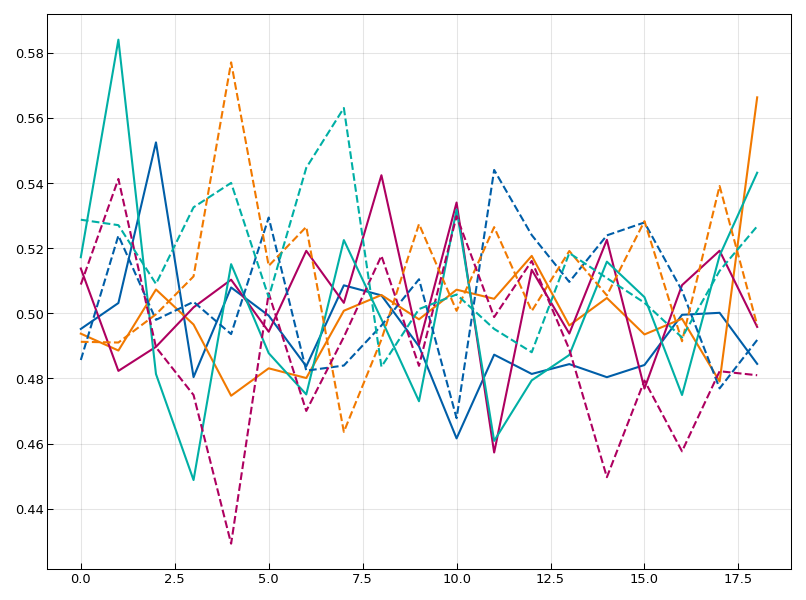

In [71]:
plt.plot(range(len(z_samples_array)),z_samples_array) 

In [61]:
### Plot the corner plots

In [62]:
def unpack_thetas(thetas):
    return [np.array(thetas[:, i::N_CLUSTERS]) for i in range(N_CLUSTERS)]

In [ ]:
sample_name = f"exp_19"
samples_s123 = np.load("samples/expl_oc_hp/em/"+ sample_name + ".npy")

In [73]:
# try the old againg

Loaded patients for ICD C02 (total 158 patients)
Loaded patients for ICD C03 (total 45 patients)
Loaded patients for ICD C04 (total 99 patients)
Loaded patients for ICD C05 (total 44 patients)
Loaded patients for ICD C06 (total 46 patients)
Loaded patients for ICD C01 (total 92 patients)
Loaded patients for ICD C09 (total 258 patients)
Loaded patients for ICD C10 (total 49 patients)


In [87]:
weights, hist = find_optimal_weights_2('test_old_oc_op')

Step 0 - - - - - - - - - - - - - - - - - - - - 
Maximation step..
 Perform MLE [1 / 1]Maximation yields: [0.05108246 0.         0.06305283 0.53774822 0.04166989 0.06317976
 0.00779337 0.01624794 0.         0.09921808 0.         0.11351719
 0.         0.21178415]
Convergence test failed 
Step 1 - - - - - - - - - - - - - - - - - - - - 
Expectation step..
 Perform MLE [1 / 1]Expectation yields: [0.94350202 0.93522192 0.44408727 0.43522034 0.58543418 0.82570334
 0.99862344 0.18405506]
Maximation step..
 Perform MLE [1 / 1]Maximation yields: [0.03035269 0.07922687 0.27132212 0.09401742 0.04536377 0.05102744
 0.01473753 0.00119959 0.03221004 0.07365102 0.12024269 0.20145578
 0.19567383 0.        ]
Condition_ [1.5202]
Step 2 - - - - - - - - - - - - - - - - - - - - 
Expectation step..
 Perform MLE [1 / 1]Expectation yields: [0.65469036 0.12478624 0.57266763 0.67502895 0.49830042 0.277454
 0.21554842 0.00491705]
Maximation step..
 Perform MLE [1 / 1]Maximation yields: [0.04887369 0.03658526 0.0

findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Lucida Calligraphy
findfont: Font family ['monospace'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'monospace' not found because none of the following families were found: Ubuntu Mono


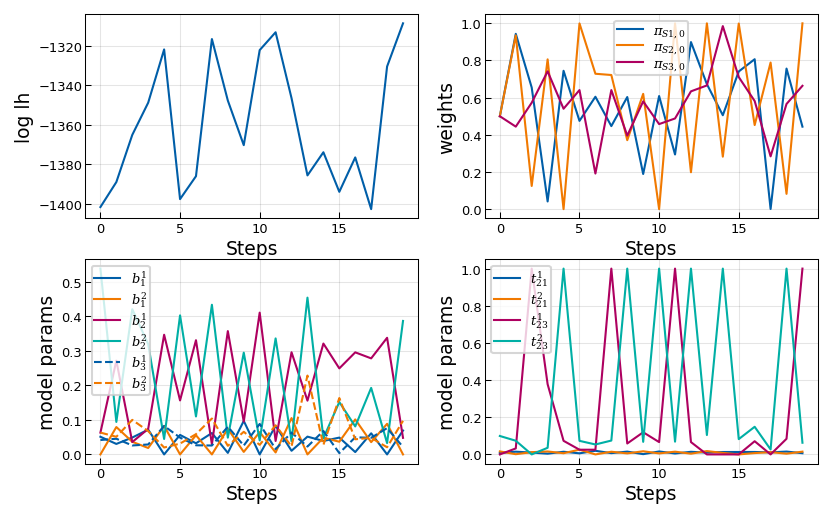

In [88]:
plot_convergence(hist)

## Crosscheck with the S-DATA from before

In [77]:
# Define the subsite we want to analyse
s_bucket = {
    "S1" : ['C03', 'C04', 'C06'],
    "S2" : ['C09', 'C01'],
    "S3" : ['C02', 'C05']
}

sdata = {}
sdata_ignore_t = {}
for s, icds in s_bucket.items():
    mask = [False]*len(dataset)
    for icd in icds:
        mask = np.logical_or(mask, dataset["tumor"]["1"]["majorsubsites"] == icd )
    sdata_ignore_t[s] = dataset[mask]

    

In [78]:
global MODELS, N_CLUSTERS

n_subsites = 3
n_clusters = 2
graph_3lnl = {
            ("tumor", "primary"): ["I", "II", "III"],
            ("lnl", "I"): [],
            ("lnl", "II"): ["I", "III"],
            ("lnl", "III"): [],
        }

models_MM = create_models(n_subsites, graph_3lnl, ignore_t_stage=True, n_mixture_components=n_clusters)
for i, (k,v) in enumerate(sdata_ignore_t.items()):
    models_MM[i].load_patient_data(v, mapping= lambda x: 'all')
    print(f"Loaded patients for ICD {k} (total {len(v)} patients)")

MODELS = models_MM
N_CLUSTERS = n_clusters

Loaded patients for ICD S1 (total 190 patients)
Loaded patients for ICD S2 (total 350 patients)
Loaded patients for ICD S3 (total 202 patients)


In [74]:
m_imputations_fun = lambda x: int(5/(20)*x + 1)

z_samples, theta_samples, history = find_optimal_weights(m_imputations = m_imputations_fun, n_steps = 20)

Step 0 - - - - - - - - - - - - - - - - - - - - 
Performing maximization: 
    theta_i: [0.06817915 0.01428807 0.14829027 0.31248731 0.03419314 0.05476969
 0.05353014 0.03436328 0.34417897 0.01040411]
Step 1 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 1 imputations.. 
Dimension: 3 with n walkers: 60
Start Burning (steps = 300) with 8 cores


 18%|█▊        | 55/300 [00:08<00:36,  6.80it/s]


KeyboardInterrupt: 

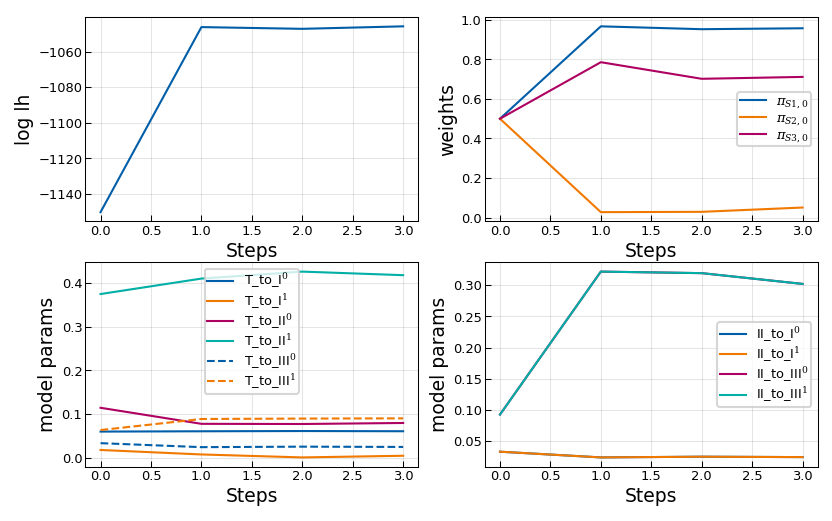

In [122]:
plot_history(history, list(sdata_ignore_t.keys()))

In [83]:
### Try with the inverted em algorithm method (sampling on theta, minimuzation on z)

m_imputations_fun = lambda x: int(5/(20)*x + 1)

z_samples_synth_inverted, theta_samples_synth_inverted, history_synth_inverted = find_optimal_weights_inverted(m_imputations = m_imputations_fun, n_steps = 4)

Step 0 - - - - - - - - - - - - - - - - - - - - 
Performing maximization: 
    z_i: [0.99993389 0.8753221  0.99993389]
Convergence Max value: 0.4443856846433007
Step 1 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 1 imputations.. 
Dimension: 10 with n walkers: 200
Start Burning (steps = 10) with 8 cores


100%|██████████| 10/10 [00:02<00:00,  3.45it/s]


the HMM sampler for model 01 accepted 30.40 % of samples.


100%|██████████| 10/10 [00:02<00:00,  3.38it/s]


the HMM sampler for model accepted 30.55 % of samples.
    thetas's: [[0.11127882 0.46136659 0.40709628 0.68968137 0.1332213  0.2778679
  0.33456414 0.02546513 0.47213606 0.71751078]]
Performing maximization: 
    z_i: [0.99993389 0.99993389 0.99993389]
Convergence Max value: 0.1405114455671987
Step 2 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 1 imputations.. 
Dimension: 10 with n walkers: 200
Start Burning (steps = 10) with 8 cores


100%|██████████| 10/10 [00:02<00:00,  3.66it/s]


the HMM sampler for model 01 accepted 32.80 % of samples.


100%|██████████| 10/10 [00:02<00:00,  3.66it/s]


the HMM sampler for model accepted 32.10 % of samples.
    thetas's: [[0.47764806 0.39517727 0.38012502 0.4748146  0.57559401 0.4267202
  0.4259271  0.62040944 0.48598873 0.62299556]]
Performing maximization: 
    z_i: [2.35353999e-05 1.62694807e-09 5.24917119e-05]
Convergence Max value: 0.4443647659170247
Step 3 - - - - - - - - - - - - - - - - - - - - 
Performing expectation with 1 imputations.. 
Dimension: 10 with n walkers: 200
Start Burning (steps = 10) with 8 cores


100%|██████████| 10/10 [00:02<00:00,  3.79it/s]


the HMM sampler for model 01 accepted 30.95 % of samples.


100%|██████████| 10/10 [00:03<00:00,  3.32it/s]


the HMM sampler for model accepted 31.25 % of samples.
    thetas's: [[0.46069743 0.2909089  0.47789605 0.64945908 0.49472222 0.4708029
  0.63411018 0.26704962 0.67235007 0.3016515 ]]
Performing maximization: 
    z_i: [6.71320552e-01 2.11108991e-09 6.06376654e-05]
Convergence Max value: 0.4443856829820603


# UTILS

## What method to use in minimize?

In [41]:
import warnings

In [31]:
z_samples = np.array([[0.06749294, 0.92483378, 0.4708104 , 0.4270811 , 0.1268381 ,
        0.79894909, 0.22113214, 0.92161109]])
assign_mixing_parameters(z_samples[0])

In [35]:
initial_guess = np.random.random(14)
q_function(initial_guess, z_samples, True)

3698.8349197381976

In [46]:


# Suppress the warning for the entire cell
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    initial_guess = np.random.random(14)
    param_bounds = [(0,1)]*14
    res = minimize(
        q_function,
        initial_guess,
        args=(z_samples, True),
        method='L-BFGS-B',
        bounds=param_bounds,
    )
    print(res.x)
    print(f'likelihood: {res.fun}')

[0.2273317  0.82527614 0.55542902 0.46604467 0.3857118  0.40994087
 0.41284673 0.98292494 0.88689056 0.93156031 0.8274139  0.37421954
 0.0373684  0.3490579 ]
likelihood: 3396.010101123743


In [47]:


# Suppress the warning for the entire cell
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    initial_guess = np.random.random(14)
    param_bounds = [(0,1)]*14
    res = minimize(
        q_function,
        initial_guess,
        args=(z_samples, True),
        method='BFGS',
        bounds=param_bounds,
    )
    print(res.x)
    print(f'likelihood: {res.fun}')

[3.05356980e-01 2.51193420e-01 2.26775146e-01 7.07607331e-01
 5.22840773e-01 3.07529560e-01 6.74376036e-01 1.61990219e-04
 6.70704840e-01 2.33860450e-01 7.54164104e-01 1.46759090e-01
 6.97929457e-01 4.06349245e-01]
likelihood: 2466.9393150504056


In [64]:


# Suppress the warning for the entire cell
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    initial_guess = np.random.random(14)
    param_bounds = [(0,1)]*14
    res = minimize(
        q_function,
        initial_guess,
        args=(z_samples, True),
        method='SLSQP',
        bounds=param_bounds,
    )
    print(res.x)
    print(f'likelihood: {res.fun}')

[0.06502274 0.0317405  0.25285611 0.20795087 0.06616183 0.03895263
 0.01009344 0.01266284 0.         0.03494651 0.05980762 0.16147696
 0.06448984 0.21429703]
likelihood: 1402.7785086405906


In [38]:
[np.random.random(8) for i in range(2)]

[array([0.0821247 , 0.04635351, 0.01121841, 0.22348371, 0.14427393,
        0.89001605, 0.75512826, 0.54121964]),
 array([0.78483309, 0.40705937, 0.90653491, 0.22125431, 0.70097915,
        0.40509264, 0.40615591, 0.29957699])]

In [56]:
import numpy as np
from scipy.optimize import minimize
import timeit
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
warnings.filterwarnings('default')

def optimize_q_function(methods, num_trials, theta_initial, z_samples, bounds):
    results = {}  # Dictionary to store results

    for method in methods:
        run_times = []  # List to store run times
        function_values = []  # List to store mean function values

        print(f"Optimizing with method '{method}':")
        
        for i in tqdm(range(num_trials), desc=f"Trials ({method})"):
            assign_mixing_parameters(z_samples[i])
            # Time the  optimization process
            start_time = timeit.default_timer()
            
            # Perform the optimization
            res = minimize(q_function, theta_initial, args=(z_samples, True), method=method, bounds=bounds)
            
            end_time = timeit.default_timer()
            
            run_times.append(end_time - start_time)
            function_values.append(res.fun)
        
        results[method] = {
            "avg_time_per_run": np.mean(run_times),
            "std_time_per_run": np.std(run_times),  # Add standard deviation of time
            "mean_function_value": np.mean(function_values),
            "f": function_values
        }
    
    return results

global MODELS, N_CLUSTERS

n_subsites = len(all_icds)
n_clusters = 2

models_MM = create_models(n_subsites, graph_4lnl, ignore_t_stage=True, n_mixture_components=n_clusters)
for i, (k,v) in enumerate(icds_masks_dict.items()):
    models_MM[i].load_patient_data(dataset[v], mapping = lambda x: 'all')
    print(f"Loaded patients for ICD {k} (total {v.sum()} patients)")

MODELS = models_MM
N_CLUSTERS = n_clusters

# Define your optimization methods and other parameters
methods = ['BFGS', 'L-BFGS-B', 'TNC', 'SLSQP', 'Powell', "Nelder-Mead", "trust-constr"]
num_trials = 5
theta_initial = np.random.rand(14)  # Replace with your initial guess
z_samples = np.array([np.random.random(8) for _ in range(num_trials)])

initial_guess = np.random.random(14)
param_bounds = [(0,1)]*14


# Run the optimization trials

results = optimize_q_function(methods, num_trials, theta_initial, z_samples, param_bounds)




Loaded patients for ICD C02 (total 158 patients)
Loaded patients for ICD C03 (total 45 patients)
Loaded patients for ICD C04 (total 99 patients)
Loaded patients for ICD C05 (total 44 patients)
Loaded patients for ICD C06 (total 46 patients)
Loaded patients for ICD C01 (total 92 patients)
Loaded patients for ICD C09 (total 258 patients)
Loaded patients for ICD C10 (total 49 patients)
Optimizing with method 'BFGS':


Trials (BFGS):   0%|          | 0/5 [00:00<?, ?it/s]/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/scipy/optimize/_minimize.py:580: RuntimeWarning: Method BFGS cannot handle bounds.
  warn('Method %s cannot handle bounds.' % method,
Trials (BFGS):  20%|██        | 1/5 [00:21<01:24, 21.12s/it]/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/scipy/optimize/_minimize.py:580: RuntimeWarning: Method BFGS cannot handle bounds.
  warn('Method %s cannot handle bounds.' % method,
Trials (BFGS):  40%|████      | 2/5 [00:42<01:03, 21.04s/it]/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/scipy/optimize/_minimize.py:580: RuntimeWarning: Method BFGS cannot handle bounds.
  warn('Method %s cannot handle bounds.' % method,
Trials (BFGS):  60%|██████    | 3/5 [01:02<00:41, 20.76s/it]/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsit

Optimizing with method 'L-BFGS-B':


Trials (L-BFGS-B):   0%|          | 0/5 [00:00<?, ?it/s]/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/scipy/optimize/_num

Optimizing with method 'TNC':


Trials (TNC):   0%|          | 0/5 [00:00<?, ?it/s]/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/scipy/optimize/_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/scipy/optimize/_numdiff.

Optimizing with method 'SLSQP':


Trials (SLSQP): 100%|██████████| 5/5 [01:58<00:00, 23.74s/it]


Optimizing with method 'Powell':


Trials (Powell): 100%|██████████| 5/5 [02:06<00:00, 25.25s/it]


Optimizing with method 'Nelder-Mead':


Trials (Nelder-Mead): 100%|██████████| 5/5 [09:00<00:00, 108.14s/it]


Optimizing with method 'trust-constr':


Trials (trust-constr):   0%|          | 0/5 [00:00<?, ?it/s]/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/scipy/optimize/_hessian_update_strategy.py:182: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  warn('delta_grad == 0.0. Check if the approximated '
/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/scipy/optimize/_hessian_update_strategy.py:182: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  warn('delta_grad == 0.0. Check if the approximated '
/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/scipy

In [57]:
results

{'BFGS': {'avg_time_per_run': 20.238519994000306,
  'std_time_per_run': 0.778565816931194,
  'mean_function_value': 2688.4809160926966,
  'f': [2688.4809160926966,
   2688.4809160926966,
   2688.4809160926966,
   2688.4809160926966,
   2688.4809160926966]},
 'L-BFGS-B': {'avg_time_per_run': 1.7569948969998221,
  'std_time_per_run': 0.1329560280688495,
  'mean_function_value': 3463.7593709944886,
  'f': [3463.7593709944886,
   3463.7593709944886,
   3463.7593709944886,
   3463.7593709944886,
   3463.7593709944886]},
 'TNC': {'avg_time_per_run': 13.726936458400086,
  'std_time_per_run': 1.5910427665479552,
  'mean_function_value': 2616.917626390688,
  'f': [2616.917626390688,
   2616.917626390688,
   2616.917626390688,
   2616.917626390688,
   2616.917626390688]},
 'SLSQP': {'avg_time_per_run': 23.741129940199606,
  'std_time_per_run': 1.0162370477143312,
  'mean_function_value': 1394.288125416464,
  'f': [1394.288125416464,
   1394.288125416464,
   1394.288125416464,
   1394.28812541646

In [72]:
import matplotlib.colors as mcolors

In [73]:
mcolors

<module 'matplotlib.colors' from '/Users/juli/Studium/Master/FS23/masterthesis/code/msth_lysubsite/.venv2/lib/python3.11/site-packages/matplotlib/colors.py'>

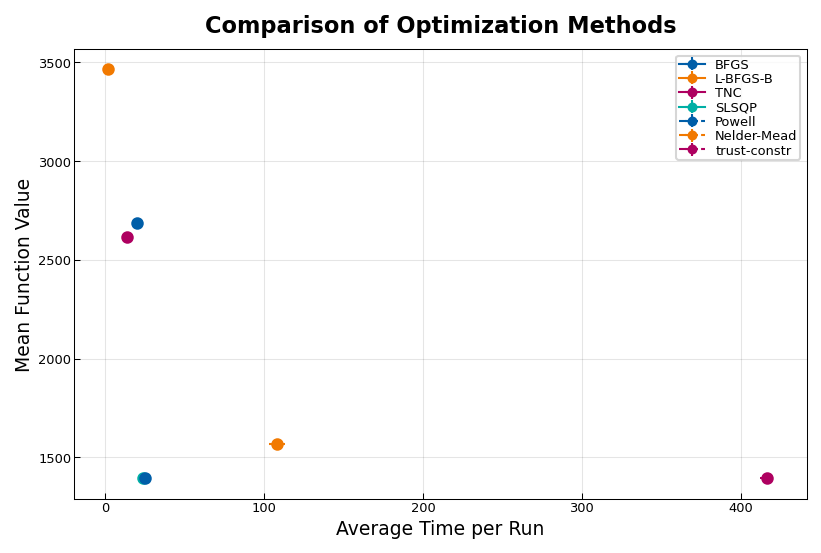

In [75]:
import matplotlib.pyplot as plt


# Assuming results, methods, and set_size are already defined

# Data extraction
avg_times = [results[method]["avg_time_per_run"] for method in methods]
std_times = [results[method]["std_time_per_run"] for method in methods]
mean_function_values = [results[method]["mean_function_value"] for method in methods]
std_function_values = [0 for method in methods]  # Assuming no std deviation for function values

# # Get the default color cycle
# default_cycler = plt.rcParams['axes.prop_cycle']

# Plotting
plt.figure(figsize=set_size(width="full"))
for i, label in enumerate(methods):
    # color = default_cycler['color'][i]  # Get the next color from the cycler
    plt.errorbar(
        avg_times[i], mean_function_values[i], 
        xerr=std_times[i], yerr=std_function_values[i], 
        marker='o', markersize=5, label=label
    )

# Labeling and styling
plt.xlabel("Average Time per Run")
plt.ylabel("Mean Function Value")
plt.title("Comparison of Optimization Methods")
plt.legend()
plt.grid(True)

# Display the plot


In [71]:
default_cycler

'#005ea8','-'
'#f17900','-'
'#ae0060','-'
'#00afa5','-'
'#005ea8','--'
'#f17900','--'
'#ae0060','--'
'#00afa5','--'
'#005ea8','-.'
'#f17900','-.'
'#ae0060','-.'


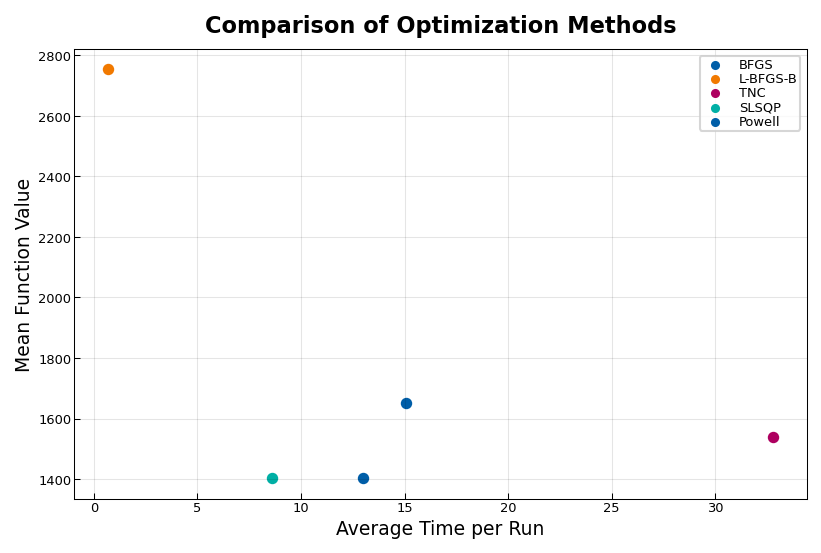

In [62]:
# Create a plot with error bars and individual markers
avg_times = [results[method]["avg_time_per_run"] for method in methods]
std_times = [results[method]["std_time_per_run"] for method in methods]
mean_function_values = [results[method]["mean_function_value"] for method in methods]
std_function_values = [results[method]["std_function_value"] for method in methods]
labels = methods

plt.figure(figsize=set_size(width="full"))
for i in range(len(labels)):
    plt.errorbar(avg_times[i], mean_function_values[i], xerr=std_times[i], yerr=std_function_values[i], marker='o', markersize=20, label=labels[i])
plt.xlabel("Average Time per Run")
plt.ylabel("Mean Function Value")
plt.title("Comparison of Optimization Methods")
plt.legend()
plt.grid(True)
plt.show()

In [36]:
results = {'BFGS': {'avg_time_per_run': 15.080984758603154,
  'mean_function_value': 1650.900063797113,
  'f': [1650.900063797113,
   1650.900063797113,
   1650.900063797113,
   1650.900063797113,
   1650.900063797113]},
 'L-BFGS-B': {'avg_time_per_run': 0.6664181870030006,
  'mean_function_value': 2753.279070378242,
  'f': [2753.279070378242,
   2753.279070378242,
   2753.279070378242,
   2753.279070378242,
   2753.279070378242]},
 'TNC': {'avg_time_per_run': 32.81626676779997,
  'mean_function_value': 1539.3888782635033,
  'f': [1539.3888782635033,
   1539.3888782635033,
   1539.3888782635033,
   1539.3888782635033,
   1539.3888782635033]},
 'SLSQP': {'avg_time_per_run': 8.609306828401168,
  'mean_function_value': 1402.778508321798,
  'f': [1402.778508321798,
   1402.778508321798,
   1402.778508321798,
   1402.778508321798,
   1402.778508321798]},
 'Powell': {'avg_time_per_run': 12.97458167860168,
  'mean_function_value': 1402.885582700547,
  'f': [1402.885582700547,
   1402.885582700547,
   1402.885582700547,
   1402.885582700547,
   1402.885582700547]}}